# Task
Given a person’s credit-related information, build a machine learning model that can classify the credit score.

Over the years, the company has collected basic bank details and gathered a lot of credit-related information. The management wants to build an intelligent system to segregate the people into credit score brackets to reduce the manual efforts.





# Importing Libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import math


import matplotlib.pyplot as plt
import scipy.stats as ss

from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler, StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report, roc_auc_score
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, VotingClassifier
import warnings
warnings.filterwarnings("ignore")

from xgboost import XGBClassifier, plot_importance

# Data Preprocessing and Exploratory Data Analysis

In [2]:
d1=pd.read_csv('train (1).csv')

In [3]:
d1.head()

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.944960,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good
2,0x1604,CUS_0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,Good
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good


### Data Description

ID: Unique ID of the record
Customer_ID: Unique ID of the customer

Month: Month of the year

Name: The name of the person

Age: The age of the person

SSN: Social Security Number of the person

Occupation: The occupation of the person

Annual_Income: The Annual Income of the person

Monthly_Inhand_Salary: Monthly in-hand salary of the person

Num_Bank_Accounts: The number of bank accounts of the person

Num_Credit_Card: Number of credit cards the person is having

Interest_Rate: The interest rate on the credit card of the person

Num_of_Loan: The number of loans taken by the person from the bank

Type_of_Loan: The types of loans taken by the person from the bank

Delay_from_due_date: The average number of days delayed by the person from the date of payment

Num_of_Delayed_Payment: Number of payments delayed by the person

Changed_Credit_Card: The percentage change in the credit card limit of the person

Num_Credit_Inquiries: The number of credit card inquiries by the person

Credit_Mix: Classification of Credit Mix of the customer

Outstanding_Debt: The outstanding balance of the person

Credit_Utilization_Ratio: The credit utilization ratio of the credit card of the customer

Credit_History_Age: The age of the credit history of the person

Payment_of_Min_Amount: Yes if the person paid the minimum amount to be paid only, otherwise no.

Total_EMI_per_month: The total EMI per month of the person

Amount_invested_monthly: The monthly amount invested by the person

Payment_Behaviour: The payment behaviour of the person

Monthly_Balance: The monthly balance left in the account of the person

Credit_Score: The credit score of the person

In [4]:
d1.shape

(100000, 28)

In [5]:
#28 columns and 100000 rows

In [6]:
d1.isnull().sum()

ID                              0
Customer_ID                     0
Month                           0
Name                         9985
Age                             0
SSN                             0
Occupation                      0
Annual_Income                   0
Monthly_Inhand_Salary       15002
Num_Bank_Accounts               0
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                     0
Type_of_Loan                11408
Delay_from_due_date             0
Num_of_Delayed_Payment       7002
Changed_Credit_Limit            0
Num_Credit_Inquiries         1965
Credit_Mix                      0
Outstanding_Debt                0
Credit_Utilization_Ratio        0
Credit_History_Age           9030
Payment_of_Min_Amount           0
Total_EMI_per_month             0
Amount_invested_monthly      4479
Payment_Behaviour               0
Monthly_Balance              1200
Credit_Score                    0
dtype: int64

In [7]:
# so these are standard nulls values

In [8]:
d1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  object 
 1   Customer_ID               100000 non-null  object 
 2   Month                     100000 non-null  object 
 3   Name                      90015 non-null   object 
 4   Age                       100000 non-null  object 
 5   SSN                       100000 non-null  object 
 6   Occupation                100000 non-null  object 
 7   Annual_Income             100000 non-null  object 
 8   Monthly_Inhand_Salary     84998 non-null   float64
 9   Num_Bank_Accounts         100000 non-null  int64  
 10  Num_Credit_Card           100000 non-null  int64  
 11  Interest_Rate             100000 non-null  int64  
 12  Num_of_Loan               100000 non-null  object 
 13  Type_of_Loan              88592 non-null   ob

In [9]:
d1.dtypes


ID                           object
Customer_ID                  object
Month                        object
Name                         object
Age                          object
SSN                          object
Occupation                   object
Annual_Income                object
Monthly_Inhand_Salary       float64
Num_Bank_Accounts             int64
Num_Credit_Card               int64
Interest_Rate                 int64
Num_of_Loan                  object
Type_of_Loan                 object
Delay_from_due_date           int64
Num_of_Delayed_Payment       object
Changed_Credit_Limit         object
Num_Credit_Inquiries        float64
Credit_Mix                   object
Outstanding_Debt             object
Credit_Utilization_Ratio    float64
Credit_History_Age           object
Payment_of_Min_Amount        object
Total_EMI_per_month         float64
Amount_invested_monthly      object
Payment_Behaviour            object
Monthly_Balance              object
Credit_Score                

In [10]:
d1.describe(include='object')
#we can see 20 categorical column, but there small conversion are necessary

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Num_of_Loan,Type_of_Loan,Num_of_Delayed_Payment,Changed_Credit_Limit,Credit_Mix,Outstanding_Debt,Credit_History_Age,Payment_of_Min_Amount,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
count,100000,100000,100000,90015,100000,100000,100000,100000,100000,88592,92998,100000,100000,100000,90970,100000,95521,100000,98800,100000
unique,100000,12500,8,10139,1788,12501,16,18940,434,6260,749,4384,4,13178,404,3,91049,7,98792,3
top,0x1602,CUS_0xd40,January,Langep,38,#F%$D@*&8,_______,36585.12,3,Not Specified,19,_,Standard,1360.45,15 Years and 11 Months,Yes,__10000__,Low_spent_Small_value_payments,__-333333333333333333333333333__,Standard
freq,1,8,12500,44,2833,5572,7062,16,14386,1408,5327,2091,36479,24,446,52326,4305,25513,9,53174


In [11]:
((d1.isnull().sum())/(d1.shape[0]))*100

ID                           0.000
Customer_ID                  0.000
Month                        0.000
Name                         9.985
Age                          0.000
SSN                          0.000
Occupation                   0.000
Annual_Income                0.000
Monthly_Inhand_Salary       15.002
Num_Bank_Accounts            0.000
Num_Credit_Card              0.000
Interest_Rate                0.000
Num_of_Loan                  0.000
Type_of_Loan                11.408
Delay_from_due_date          0.000
Num_of_Delayed_Payment       7.002
Changed_Credit_Limit         0.000
Num_Credit_Inquiries         1.965
Credit_Mix                   0.000
Outstanding_Debt             0.000
Credit_Utilization_Ratio     0.000
Credit_History_Age           9.030
Payment_of_Min_Amount        0.000
Total_EMI_per_month          0.000
Amount_invested_monthly      4.479
Payment_Behaviour            0.000
Monthly_Balance              1.200
Credit_Score                 0.000
dtype: float64

In [12]:
#no column has more than 30% null values, so we wont drop anu column

In [13]:
d1.nunique()

ID                          100000
Customer_ID                  12500
Month                            8
Name                         10139
Age                           1788
SSN                          12501
Occupation                      16
Annual_Income                18940
Monthly_Inhand_Salary        13235
Num_Bank_Accounts              943
Num_Credit_Card               1179
Interest_Rate                 1750
Num_of_Loan                    434
Type_of_Loan                  6260
Delay_from_due_date             73
Num_of_Delayed_Payment         749
Changed_Credit_Limit          4384
Num_Credit_Inquiries          1223
Credit_Mix                       4
Outstanding_Debt             13178
Credit_Utilization_Ratio    100000
Credit_History_Age             404
Payment_of_Min_Amount            3
Total_EMI_per_month          14950
Amount_invested_monthly      91049
Payment_Behaviour                7
Monthly_Balance              98792
Credit_Score                     3
dtype: int64

In [14]:
# Drop the Columns we not use in model
d1.drop(columns=['ID', 'Customer_ID','Name', 'SSN'], inplace=True)
#these are unique category, and so use

# Initial Conversion

In [15]:
d1.select_dtypes('object').describe().T

,count,unique,top,freq
Month,100000,8,January,12500
Age,100000,1788,38,2833
Occupation,100000,16,_______,7062
Annual_Income,100000,18940,36585.12,16
Num_of_Loan,100000,434,3,14386
Type_of_Loan,88592,6260,Not Specified,1408
Num_of_Delayed_Payment,92998,749,19,5327
Changed_Credit_Limit,100000,4384,_,2091
Credit_Mix,100000,4,Standard,36479
Outstanding_Debt,100000,13178,1360.45,24


In [16]:
# Removing Special Character 

d1 = d1.applymap(lambda x: x if x is np.NaN or not isinstance(x, str) else 
                 str(x).strip('_ ,"')).replace(['',
                                                '_',
                                                '-', 
                                                '-333333333333333333333333333'
                                                ,'nan', 
                                                '__10000__',
                                                '!@9#%8', 
                                                '#F%$D@*&8'], np.NaN)


d1.applymap(lambda x: x if x is np.NaN or not isinstance(x, str) else str(x).strip('_ ,"')): This line applies a lambda function to each element in the DataFrame d1.

The lambda function checks if the element (x) is either np.NaN (a NumPy NaN value) or not an instance of a string. 

If it meets either of these conditions, the element remains unchanged. Otherwise, if the element is a string, leading and trailing underscores, spaces, and commas are stripped using the strip() method, and the modified string is returned.

In [17]:
#we have to remove unwanted names, so we are removing such things, and we convert them to null values

In [18]:
d1.select_dtypes('object').describe().T

,count,unique,top,freq
Month,100000,8,January,12500
Age,100000,1728,38,2994
Occupation,92938,15,Lawyer,6575
Annual_Income,100000,13487,17816.75,16
Num_of_Loan,100000,414,3,15104
Type_of_Loan,88592,6260,Not Specified,1408
Num_of_Delayed_Payment,92998,711,19,5481
Changed_Credit_Limit,97909,4383,8.22,133
Credit_Mix,79805,3,Standard,36479
Outstanding_Debt,100000,12203,1109.03,24


In [19]:
d1.isnull().sum()

Month                           0
Age                             0
Occupation                   7062
Annual_Income                   0
Monthly_Inhand_Salary       15002
Num_Bank_Accounts               0
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                     0
Type_of_Loan                11408
Delay_from_due_date             0
Num_of_Delayed_Payment       7002
Changed_Credit_Limit         2091
Num_Credit_Inquiries         1965
Credit_Mix                  20195
Outstanding_Debt                0
Credit_Utilization_Ratio        0
Credit_History_Age           9030
Payment_of_Min_Amount           0
Total_EMI_per_month             0
Amount_invested_monthly      4479
Payment_Behaviour            7600
Monthly_Balance              1209
Credit_Score                    0
dtype: int64

In [20]:
#Conversion part

In [21]:
# Cleaning the Age column
d1['Age'] = d1.Age.str.replace('-', '')

In [22]:
# Rounding Some column into 2 decimal places, 
# but first we move convert it from obect to a float
d1['Monthly_Balance'] = d1.Monthly_Balance.astype(float)
d1['Amount_invested_monthly'] = d1.Amount_invested_monthly.astype(float)
d1['Total_EMI_per_month'] = d1.Total_EMI_per_month.astype(float)
d1['Credit_Utilization_Ratio'] = d1.Credit_Utilization_Ratio.astype(float)
d1['Monthly_Inhand_Salary'] = d1.Monthly_Inhand_Salary.astype(float)
d1['Annual_Income'] = d1.Annual_Income.astype(float)
d1['Outstanding_Debt'] = d1.Outstanding_Debt.astype(float)
d1['Age'] = d1.Age.astype(float)
d1['Num_of_Loan'] =d1['Num_of_Loan'].astype(int)
d1['Num_of_Delayed_Payment'] =d1['Num_of_Delayed_Payment'].astype(float)
d1['Changed_Credit_Limit'] = d1['Changed_Credit_Limit'].astype(float)
d1['Num_Credit_Inquiries'] = d1['Num_Credit_Inquiries'].astype(float)

In [23]:
#Rounding the values into two decimal places
d1['Monthly_Inhand_Salary']= d1['Monthly_Inhand_Salary'].round(2)
d1['Monthly_Balance'] = d1['Monthly_Balance'].round(decimals = 2)
d1['Amount_invested_monthly'] = d1['Amount_invested_monthly'].round(decimals = 2)
d1['Total_EMI_per_month'] = d1['Total_EMI_per_month'].round(decimals = 2)
d1['Credit_Utilization_Ratio'] =  d1['Credit_Utilization_Ratio'].round(decimals = 2)
d1['Monthly_Inhand_Salary'] = d1['Monthly_Inhand_Salary'].round(decimals = 2)
d1['Annual_Income'] = d1['Annual_Income'].round(decimals = 2)

In [24]:
d1.shape

(100000, 24)

In [25]:
# Set the display options
pd.set_option('display.max_columns', None)
d1

,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,January,23.0,Scientist,19114.12,1824.84,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3,7.0,11.27,4.0,NaN,809.98,26.82,22 Years and 1 Months,No,49.57,80.42,High_spent_Small_value_payments,312.49,Good
1,February,23.0,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",-1,NaN,11.27,4.0,Good,809.98,31.94,NaN,No,49.57,118.28,Low_spent_Large_value_payments,284.63,Good
2,March,500.0,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3,7.0,NaN,4.0,Good,809.98,28.61,22 Years and 3 Months,No,49.57,81.70,Low_spent_Medium_value_payments,331.21,Good
3,April,23.0,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",5,4.0,6.27,4.0,Good,809.98,31.38,22 Years and 4 Months,No,49.57,199.46,Low_spent_Small_value_payments,223.45,Good
4,May,23.0,Scientist,19114.12,1824.84,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",6,NaN,11.27,4.0,Good,809.98,24.80,22 Years and 5 Months,No,49.57,41.42,High_spent_Medium_value_payments,341.49,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,April,25.0,Mechanic,39628.99,3359.42,4,6,7,2,"Auto Loan, and Student Loan",23,7.0,11.50,3.0,NaN,502.38,34.66,31 Years and 6 Months,No,35.10,60.97,High_spent_Large_value_payments,479.87,Poor
99996,May,25.0,Mechanic,39628.99,3359.42,4,6,7,2,"Auto Loan, and Student Loan",18,7.0,11.50,3.0,NaN,502.38,40.57,31 Years and 7 Months,No,35.10,54.19,High_spent_Medium_value_payments,496.65,Poor
99997,June,25.0,Mechanic,39628.99,3359.42,4,6,5729,2,"Auto Loan, and Student Loan",27,6.0,11.50,3.0,Good,502.38,41.26,31 Years and 8 Months,No,35.10,24.03,High_spent_Large_value_payments,516.81,Poor
99998,July,25.0,Mechanic,39628.99,3359.42,4,6,7,2,"Auto Loan, and Student Loan",20,NaN,11.50,3.0,Good,502.38,33.64,31 Years and 9 Months,No,35.10,251.67,Low_spent_Large_value_payments,319.16,Standard


In [26]:
d1

,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,January,23.0,Scientist,19114.12,1824.84,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3,7.0,11.27,4.0,NaN,809.98,26.82,22 Years and 1 Months,No,49.57,80.42,High_spent_Small_value_payments,312.49,Good
1,February,23.0,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",-1,NaN,11.27,4.0,Good,809.98,31.94,NaN,No,49.57,118.28,Low_spent_Large_value_payments,284.63,Good
2,March,500.0,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3,7.0,NaN,4.0,Good,809.98,28.61,22 Years and 3 Months,No,49.57,81.70,Low_spent_Medium_value_payments,331.21,Good
3,April,23.0,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",5,4.0,6.27,4.0,Good,809.98,31.38,22 Years and 4 Months,No,49.57,199.46,Low_spent_Small_value_payments,223.45,Good
4,May,23.0,Scientist,19114.12,1824.84,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",6,NaN,11.27,4.0,Good,809.98,24.80,22 Years and 5 Months,No,49.57,41.42,High_spent_Medium_value_payments,341.49,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,April,25.0,Mechanic,39628.99,3359.42,4,6,7,2,"Auto Loan, and Student Loan",23,7.0,11.50,3.0,NaN,502.38,34.66,31 Years and 6 Months,No,35.10,60.97,High_spent_Large_value_payments,479.87,Poor
99996,May,25.0,Mechanic,39628.99,3359.42,4,6,7,2,"Auto Loan, and Student Loan",18,7.0,11.50,3.0,NaN,502.38,40.57,31 Years and 7 Months,No,35.10,54.19,High_spent_Medium_value_payments,496.65,Poor
99997,June,25.0,Mechanic,39628.99,3359.42,4,6,5729,2,"Auto Loan, and Student Loan",27,6.0,11.50,3.0,Good,502.38,41.26,31 Years and 8 Months,No,35.10,24.03,High_spent_Large_value_payments,516.81,Poor
99998,July,25.0,Mechanic,39628.99,3359.42,4,6,7,2,"Auto Loan, and Student Loan",20,NaN,11.50,3.0,Good,502.38,33.64,31 Years and 9 Months,No,35.10,251.67,Low_spent_Large_value_payments,319.16,Standard


In [27]:
# Cleeaning the Age column, removing outliers and replacing characters with the median of the Age values

for i in d1.Age.values:
    if i > 95:
        d1.Age.replace(i, np.median(d1.Age), inplace=True)
        
# Replacing the inconsistent entry in the Age column

d1.Age.replace(-500, np.median(d1.Age), inplace=True)
for i in d1.Age.values:
    if i > 95:
        d1.Age.replace(i, np.median(d1.Age), inplace=True)

In [28]:
d1['Age'].max()

95.0

In [29]:
for i in d1:
    a=d1[i].unique()
    print(a)

['January' 'February' 'March' 'April' 'May' 'June' 'July' 'August']
[23. 34. 28. 54. 55. 21. 31. 33. 30. 24. 44. 45. 40. 41. 32. 35. 36. 39.
 37. 20. 46. 26. 42. 19. 48. 38. 43. 22. 16. 18. 15. 27. 25. 14. 17. 47.
 53. 56. 29. 49. 51. 50. 52. 95.]
['Scientist' nan 'Teacher' 'Engineer' 'Entrepreneur' 'Developer' 'Lawyer'
 'Media_Manager' 'Doctor' 'Journalist' 'Manager' 'Accountant' 'Musician'
 'Mechanic' 'Writer' 'Architect']
[ 19114.12  34847.84 143162.64 ...  37188.1   20002.88  39628.99]
[1824.84     nan 3037.99 ... 3097.01 1929.91 3359.42]
[   3    2    1    7    4    0    8    5    6    9   10 1414 1231   67
  572 1488   91  528 1647 1696 1338  649  889 1668  685  857  975 1496
 1534 1620   37 1388 1429 1332 1588  120 1777 1096  803  494  744 1139
  831 1613  741  121  665 1748 1644  823 1356 1651   87  711  450  210
 1671 1722  648  672 1662 1495  510  666  429 1131 1434  980 1026  526
  718 1300 1312 1315  501 1566  480 1042  322  628 1016  333 1265  791
  427  563  905 1190 1036

In [30]:
d1['Occupation'].unique()

array(['Scientist', nan, 'Teacher', 'Engineer', 'Entrepreneur',
       'Developer', 'Lawyer', 'Media_Manager', 'Doctor', 'Journalist',
       'Manager', 'Accountant', 'Musician', 'Mechanic', 'Writer',
       'Architect'], dtype=object)

<AxesSubplot:ylabel='Frequency'>

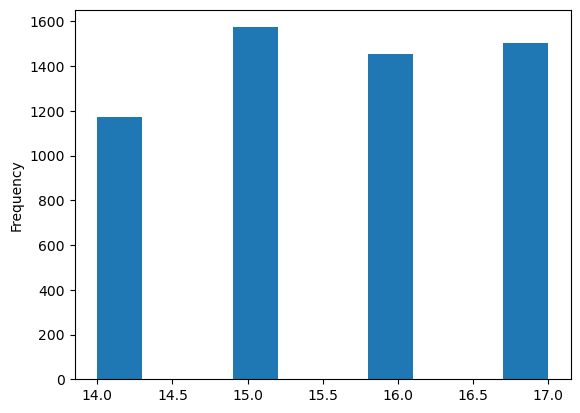

In [31]:
d1[d1['Age'] < 18]['Age'].plot.hist()

In [32]:
a=d1[d1['Age'] < 18]

In [33]:
#d1.replace(a, np.nan, inplace=True)
d1.loc[d1['Age'] < 18, 'Age'] = np.nan
#replaced values which are small are than 18
#minimum 18 years of age to apply for a Credit Card

In [34]:
d1['Age'].min()

18.0

In [35]:
d1['Age'].isnull().sum()

5706

In [36]:
d1['Num_Bank_Accounts'].min()

-1

In [37]:
d1.loc[d1['Num_Bank_Accounts'] < 1, 'Num_Bank_Accounts'] = np.nan
#converted all values lesser than 1

In [38]:
d1.loc[d1['Num_of_Loan'] < 0, 'Num_of_Loan'] = np.nan

In [39]:
d1['Num_of_Loan'].min()

0.0

In [40]:
d1['Delay_from_due_date'].min()
d1.loc[d1['Delay_from_due_date'] < 0, 'Delay_from_due_date'] = np.nan

In [41]:
d1.loc[d1['Num_of_Delayed_Payment'] < 0, 'Num_of_Delayed_Payment'] = np.nan

In [42]:
d1.loc[d1['Changed_Credit_Limit'] < 0, 'Changed_Credit_Limit'] = np.nan

In [43]:
d1.min()

Month                         April
Age                            18.0
Annual_Income               7005.93
Monthly_Inhand_Salary        303.65
Num_Bank_Accounts               1.0
Num_Credit_Card                   0
Interest_Rate                     1
Num_of_Loan                     0.0
Delay_from_due_date             0.0
Num_of_Delayed_Payment          0.0
Changed_Credit_Limit            0.0
Num_Credit_Inquiries            0.0
Outstanding_Debt               0.23
Credit_Utilization_Ratio       20.0
Payment_of_Min_Amount            NM
Total_EMI_per_month             0.0
Amount_invested_monthly         0.0
Monthly_Balance                0.01
Credit_Score                   Good
dtype: object

# Null value Treatment

In [44]:
duplicate_rows = d1.duplicated().sum()

# Display the duplicate rows
print(duplicate_rows)

0


In [45]:
d1.isnull().sum()

Month                           0
Age                          5706
Occupation                   7062
Annual_Income                   0
Monthly_Inhand_Salary       15002
Num_Bank_Accounts            4349
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                  3876
Type_of_Loan                11408
Delay_from_due_date           591
Num_of_Delayed_Payment       7646
Changed_Credit_Limit         3677
Num_Credit_Inquiries         1965
Credit_Mix                  20195
Outstanding_Debt                0
Credit_Utilization_Ratio        0
Credit_History_Age           9030
Payment_of_Min_Amount           0
Total_EMI_per_month             0
Amount_invested_monthly      4479
Payment_Behaviour            7600
Monthly_Balance              1209
Credit_Score                    0
dtype: int64

In [46]:
#Occupation 

In [47]:
d1['Occupation'].unique()

array(['Scientist', nan, 'Teacher', 'Engineer', 'Entrepreneur',
       'Developer', 'Lawyer', 'Media_Manager', 'Doctor', 'Journalist',
       'Manager', 'Accountant', 'Musician', 'Mechanic', 'Writer',
       'Architect'], dtype=object)

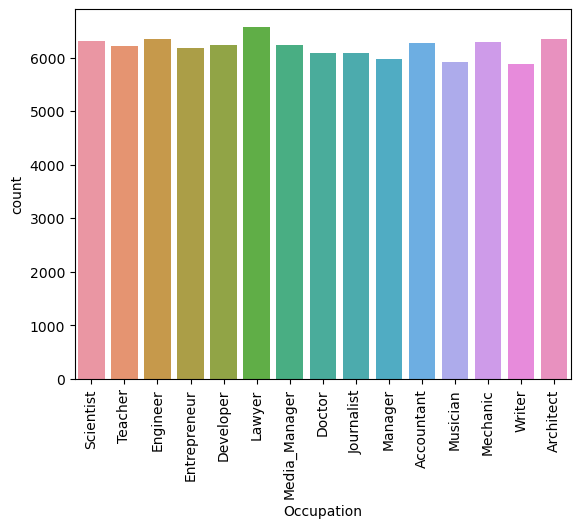

In [48]:
sns.countplot(d1['Occupation'])
plt.xticks(rotation=90)

# Show the plot
plt.show()

In [49]:
#so we cant replace 'nan' with mode, so we drop them

In [50]:
d1.dropna(subset=['Occupation'], inplace=True)

In [51]:
d1.isnull().sum()

Month                           0
Age                          5299
Occupation                      0
Annual_Income                   0
Monthly_Inhand_Salary       13942
Num_Bank_Accounts            4053
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                  3591
Type_of_Loan                10543
Delay_from_due_date           537
Num_of_Delayed_Payment       7089
Changed_Credit_Limit         3411
Num_Credit_Inquiries         1839
Credit_Mix                  18774
Outstanding_Debt                0
Credit_Utilization_Ratio        0
Credit_History_Age           8406
Payment_of_Min_Amount           0
Total_EMI_per_month             0
Amount_invested_monthly      4160
Payment_Behaviour            7086
Monthly_Balance              1133
Credit_Score                    0
dtype: int64

In [52]:
#Monthly_Inhand_Salary

In [53]:
d1['Monthly_Inhand_Salary']

0        1824.84
1            NaN
2            NaN
3            NaN
4        1824.84
          ...   
99995    3359.42
99996    3359.42
99997    3359.42
99998    3359.42
99999    3359.42
Name: Monthly_Inhand_Salary, Length: 92938, dtype: float64

In [54]:
# Step 1: Sort the data by 'age' column in descending order
d1.sort_values(by='Age', ascending=False)

# Step 2: Use backward fill (bfill) to replace NaN values in 'monthly salary' column
d1['Monthly_Inhand_Salary'].fillna(method='bfill', inplace=True)

# Display the updated DataFrame
print(d1.isnull().sum()) 

Month                           0
Age                          5299
Occupation                      0
Annual_Income                   0
Monthly_Inhand_Salary           0
Num_Bank_Accounts            4053
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                  3591
Type_of_Loan                10543
Delay_from_due_date           537
Num_of_Delayed_Payment       7089
Changed_Credit_Limit         3411
Num_Credit_Inquiries         1839
Credit_Mix                  18774
Outstanding_Debt                0
Credit_Utilization_Ratio        0
Credit_History_Age           8406
Payment_of_Min_Amount           0
Total_EMI_per_month             0
Amount_invested_monthly      4160
Payment_Behaviour            7086
Monthly_Balance              1133
Credit_Score                    0
dtype: int64


In [55]:
#Monthly_Balance

In [56]:
# Step 1: Sort the data by 'age' column in descending order
d1.sort_values(by='Age', ascending=False)

# Step 2: Use backward fill (bfill) to replace NaN values in 'monthly salary' column
d1['Monthly_Balance'].fillna(method='bfill', inplace=True)

# Display the updated DataFrame
print(d1.isnull().sum())

Month                           0
Age                          5299
Occupation                      0
Annual_Income                   0
Monthly_Inhand_Salary           0
Num_Bank_Accounts            4053
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                  3591
Type_of_Loan                10543
Delay_from_due_date           537
Num_of_Delayed_Payment       7089
Changed_Credit_Limit         3411
Num_Credit_Inquiries         1839
Credit_Mix                  18774
Outstanding_Debt                0
Credit_Utilization_Ratio        0
Credit_History_Age           8406
Payment_of_Min_Amount           0
Total_EMI_per_month             0
Amount_invested_monthly      4160
Payment_Behaviour            7086
Monthly_Balance                 0
Credit_Score                    0
dtype: int64


In [57]:
#Amount_invested_monthly

In [58]:
# Step 1: Sort the data by 'age' column in descending order
d1.sort_values(by='Age', ascending=False)

# Step 2: Use backward fill (bfill) to replace NaN values in 'monthly salary' column
d1['Amount_invested_monthly'].fillna(method='bfill', inplace=True)

# Display the updated DataFrame
print(d1.isnull().sum())

Month                           0
Age                          5299
Occupation                      0
Annual_Income                   0
Monthly_Inhand_Salary           0
Num_Bank_Accounts            4053
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                  3591
Type_of_Loan                10543
Delay_from_due_date           537
Num_of_Delayed_Payment       7089
Changed_Credit_Limit         3411
Num_Credit_Inquiries         1839
Credit_Mix                  18774
Outstanding_Debt                0
Credit_Utilization_Ratio        0
Credit_History_Age           8406
Payment_of_Min_Amount           0
Total_EMI_per_month             0
Amount_invested_monthly         0
Payment_Behaviour            7086
Monthly_Balance                 0
Credit_Score                    0
dtype: int64


In [59]:
#Payment_Behaviour 

In [60]:
d1['Payment_Behaviour'].nunique()

6

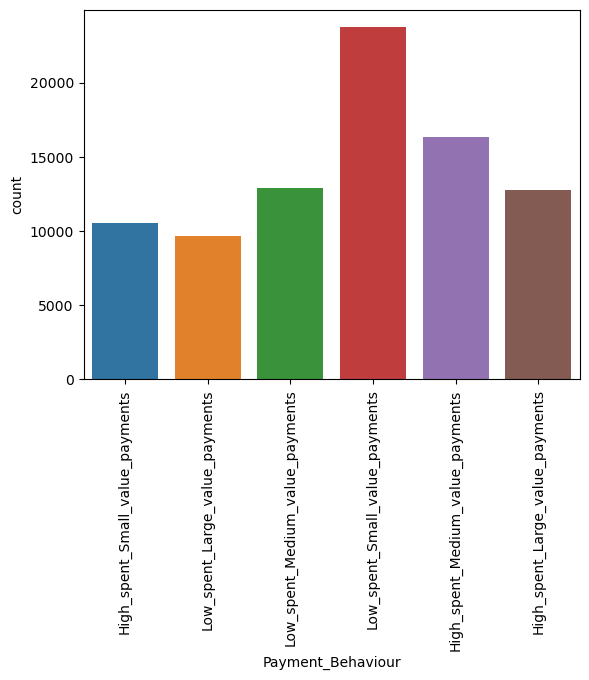

In [61]:
sns.countplot(d1['Payment_Behaviour'])
plt.xticks(rotation=90)

# Show the plot
plt.show()

In [62]:
d1['Payment_Behaviour'].nunique()

6

In [63]:

# Calculate the mode of the column
mode_value = d1['Payment_Behaviour'].mode()[0]

# Replace NaN values with the mode value
d1['Payment_Behaviour'].fillna(mode_value, inplace=True)
print(d1.isnull().sum())

Month                           0
Age                          5299
Occupation                      0
Annual_Income                   0
Monthly_Inhand_Salary           0
Num_Bank_Accounts            4053
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                  3591
Type_of_Loan                10543
Delay_from_due_date           537
Num_of_Delayed_Payment       7089
Changed_Credit_Limit         3411
Num_Credit_Inquiries         1839
Credit_Mix                  18774
Outstanding_Debt                0
Credit_Utilization_Ratio        0
Credit_History_Age           8406
Payment_of_Min_Amount           0
Total_EMI_per_month             0
Amount_invested_monthly         0
Payment_Behaviour               0
Monthly_Balance                 0
Credit_Score                    0
dtype: int64


In [64]:
#Credit_History_Age 

In [65]:
d1['Credit_History_Age'].nunique()

404

In [66]:
# Step 1: Sort the data by 'age' column in descending order
d1.sort_values(by='Age', ascending=False)

# Step 2: Use backward fill (bfill) to replace NaN values in 'monthly salary' column
d1['Credit_History_Age'].fillna(method='ffill', inplace=True)

# Display the updated DataFrame
print(d1.isnull().sum())

Month                           0
Age                          5299
Occupation                      0
Annual_Income                   0
Monthly_Inhand_Salary           0
Num_Bank_Accounts            4053
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                  3591
Type_of_Loan                10543
Delay_from_due_date           537
Num_of_Delayed_Payment       7089
Changed_Credit_Limit         3411
Num_Credit_Inquiries         1839
Credit_Mix                  18774
Outstanding_Debt                0
Credit_Utilization_Ratio        0
Credit_History_Age              0
Payment_of_Min_Amount           0
Total_EMI_per_month             0
Amount_invested_monthly         0
Payment_Behaviour               0
Monthly_Balance                 0
Credit_Score                    0
dtype: int64


In [67]:
#Credit_Mix

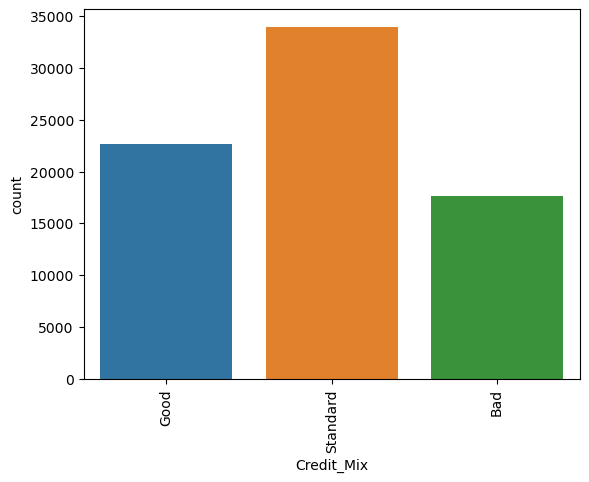

In [68]:
sns.countplot(d1['Credit_Mix'])
plt.xticks(rotation=90)

# Show the plot
plt.show()

In [69]:
# Step 1: Sort the data by 'age' column in descending order
d1.sort_values(by='Age', ascending=False)

# Step 2: Use backward fill (bfill) to replace NaN values in 'monthly salary' column
d1['Credit_Mix'].fillna(method='ffill', inplace=True)

# Display the updated DataFrame
print(d1.isnull().sum())

Month                           0
Age                          5299
Occupation                      0
Annual_Income                   0
Monthly_Inhand_Salary           0
Num_Bank_Accounts            4053
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                  3591
Type_of_Loan                10543
Delay_from_due_date           537
Num_of_Delayed_Payment       7089
Changed_Credit_Limit         3411
Num_Credit_Inquiries         1839
Credit_Mix                      1
Outstanding_Debt                0
Credit_Utilization_Ratio        0
Credit_History_Age              0
Payment_of_Min_Amount           0
Total_EMI_per_month             0
Amount_invested_monthly         0
Payment_Behaviour               0
Monthly_Balance                 0
Credit_Score                    0
dtype: int64


In [70]:
d1.sort_values(by='Age', ascending=False)

# Step 2: Use backward fill (bfill) to replace NaN values in 'monthly salary' column
d1['Credit_History_Age'].fillna(method='ffill', inplace=True)

# Display the updated DataFrame
print(d1.isnull().sum())

Month                           0
Age                          5299
Occupation                      0
Annual_Income                   0
Monthly_Inhand_Salary           0
Num_Bank_Accounts            4053
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                  3591
Type_of_Loan                10543
Delay_from_due_date           537
Num_of_Delayed_Payment       7089
Changed_Credit_Limit         3411
Num_Credit_Inquiries         1839
Credit_Mix                      1
Outstanding_Debt                0
Credit_Utilization_Ratio        0
Credit_History_Age              0
Payment_of_Min_Amount           0
Total_EMI_per_month             0
Amount_invested_monthly         0
Payment_Behaviour               0
Monthly_Balance                 0
Credit_Score                    0
dtype: int64


In [71]:
d1.sort_values(by='Age', ascending=False)

# Step 2: Use backward fill (bfill) to replace NaN values in 'monthly salary' column
d1['Num_of_Loan'].fillna(method='ffill', inplace=True)

# Display the updated DataFrame
print(d1.isnull().sum())

Month                           0
Age                          5299
Occupation                      0
Annual_Income                   0
Monthly_Inhand_Salary           0
Num_Bank_Accounts            4053
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                     0
Type_of_Loan                10543
Delay_from_due_date           537
Num_of_Delayed_Payment       7089
Changed_Credit_Limit         3411
Num_Credit_Inquiries         1839
Credit_Mix                      1
Outstanding_Debt                0
Credit_Utilization_Ratio        0
Credit_History_Age              0
Payment_of_Min_Amount           0
Total_EMI_per_month             0
Amount_invested_monthly         0
Payment_Behaviour               0
Monthly_Balance                 0
Credit_Score                    0
dtype: int64


In [72]:
#Num_Credit_Inquiries, Changed_Credit_Limit,Credit_Mix, Num_of_Delayed_Payment, Delay_from_due_date','Num_Bank_Accounts','Age', Step 1: Sort the data by 'age' column in descending order
d1.sort_values(by='Age', ascending=False)

# Step 2: Use backward fill (bfill) to replace NaN values in 'monthly salary' column
d1['Credit_Mix'].fillna(method='ffill', inplace=True)

# Display the updated DataFrame
print(d1.isnull().sum())

Month                           0
Age                          5299
Occupation                      0
Annual_Income                   0
Monthly_Inhand_Salary           0
Num_Bank_Accounts            4053
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                     0
Type_of_Loan                10543
Delay_from_due_date           537
Num_of_Delayed_Payment       7089
Changed_Credit_Limit         3411
Num_Credit_Inquiries         1839
Credit_Mix                      1
Outstanding_Debt                0
Credit_Utilization_Ratio        0
Credit_History_Age              0
Payment_of_Min_Amount           0
Total_EMI_per_month             0
Amount_invested_monthly         0
Payment_Behaviour               0
Monthly_Balance                 0
Credit_Score                    0
dtype: int64


In [73]:
d1.dropna(subset=['Num_Credit_Inquiries','Changed_Credit_Limit'], inplace=True)

In [74]:
d1.dropna(subset=['Credit_Mix'], inplace=True)

In [75]:
d1.dropna(subset=['Num_of_Delayed_Payment'], inplace=True)

In [76]:
d1.dropna(subset=['Delay_from_due_date','Num_Bank_Accounts','Age'], inplace=True)

In [77]:
d1.isnull().sum()

Month                          0
Age                            0
Occupation                     0
Annual_Income                  0
Monthly_Inhand_Salary          0
Num_Bank_Accounts              0
Num_Credit_Card                0
Interest_Rate                  0
Num_of_Loan                    0
Type_of_Loan                8098
Delay_from_due_date            0
Num_of_Delayed_Payment         0
Changed_Credit_Limit           0
Num_Credit_Inquiries           0
Credit_Mix                     0
Outstanding_Debt               0
Credit_Utilization_Ratio       0
Credit_History_Age             0
Payment_of_Min_Amount          0
Total_EMI_per_month            0
Amount_invested_monthly        0
Payment_Behaviour              0
Monthly_Balance                0
Credit_Score                   0
dtype: int64

In [78]:
d1['Num_of_Delayed_Payment'].mode()

0    19.0
Name: Num_of_Delayed_Payment, dtype: float64

In [79]:
d1['Num_of_Delayed_Payment'].nunique()

585

In [80]:
#Type_of_Loan

In [81]:
d1['Type_of_Loan'].nunique()

5803

In [82]:
d1['Type_of_Loan'].value_counts()

Not Specified                                                                                           985
Credit-Builder Loan                                                                                     972
Personal Loan                                                                                           961
Debt Consolidation Loan                                                                                 939
Mortgage Loan                                                                                           874
                                                                                                       ... 
Home Equity Loan, Not Specified, Credit-Builder Loan, Auto Loan, Student Loan, and Mortgage Loan          1
Mortgage Loan, Student Loan, Mortgage Loan, Home Equity Loan, Personal Loan, and Credit-Builder Loan      1
Not Specified, Home Equity Loan, Student Loan, and Student Loan                                           1
Auto Loan, Personal Loan, No

There is a multi class problem here. We will deal with it later

In [83]:
#It seems some records have more than one loan type. So we can explore all types and evaluate each as a binary feature

In [84]:
d1['Type_of_Loan'].replace({np.nan:'Not_Specified'}, inplace = True)

In [85]:
d1['Type_of_Loan'].mode()

0    Not_Specified
Name: Type_of_Loan, dtype: object

In [86]:
d1.isnull().sum()

Month                       0
Age                         0
Occupation                  0
Annual_Income               0
Monthly_Inhand_Salary       0
Num_Bank_Accounts           0
Num_Credit_Card             0
Interest_Rate               0
Num_of_Loan                 0
Type_of_Loan                0
Delay_from_due_date         0
Num_of_Delayed_Payment      0
Changed_Credit_Limit        0
Num_Credit_Inquiries        0
Credit_Mix                  0
Outstanding_Debt            0
Credit_Utilization_Ratio    0
Credit_History_Age          0
Payment_of_Min_Amount       0
Total_EMI_per_month         0
Amount_invested_monthly     0
Payment_Behaviour           0
Monthly_Balance             0
Credit_Score                0
dtype: int64

In [87]:
#no null values

# Outlier treatment

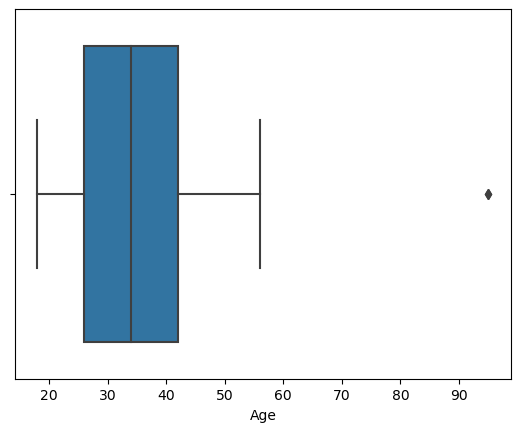

min 18.0 max 95.0


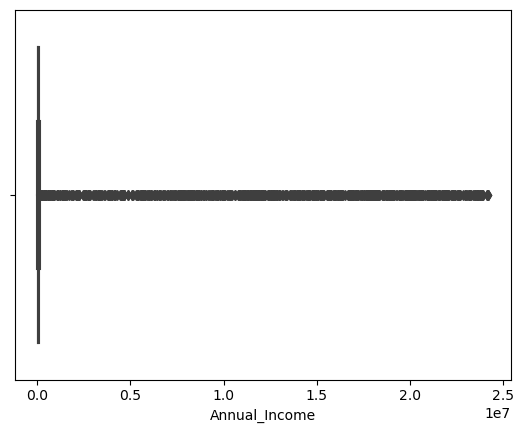

min 7006.04 max 24198062.0


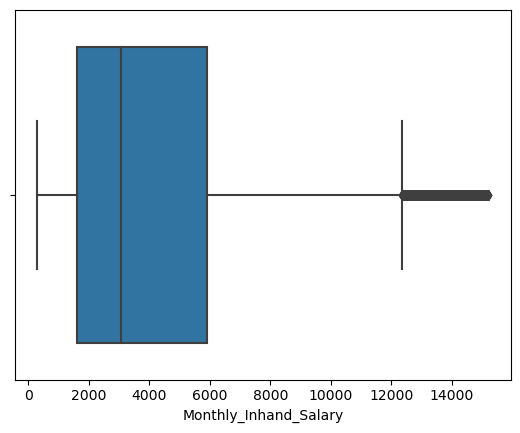

min 303.65 max 15204.63


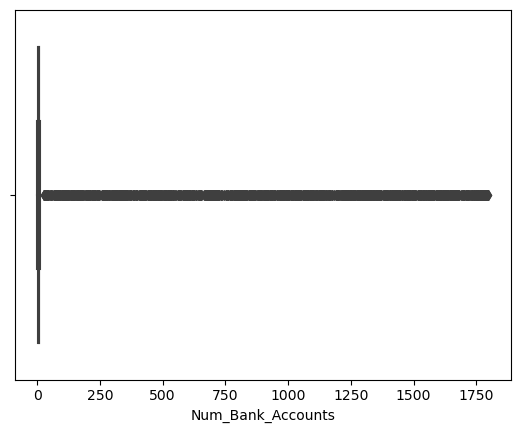

min 1.0 max 1798.0


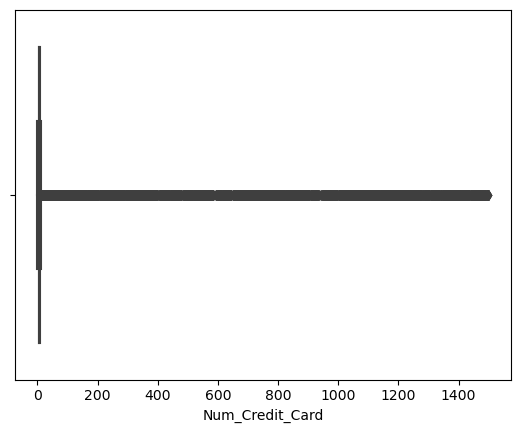

min 0 max 1499


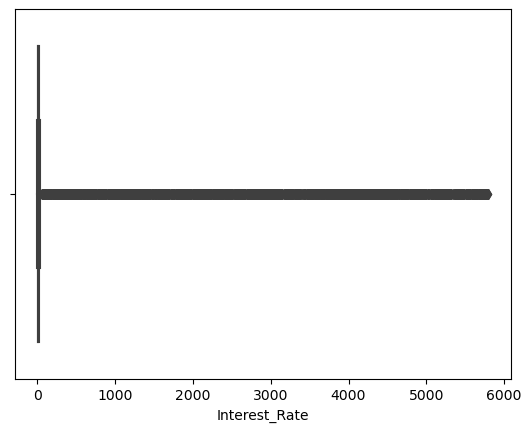

min 1 max 5797


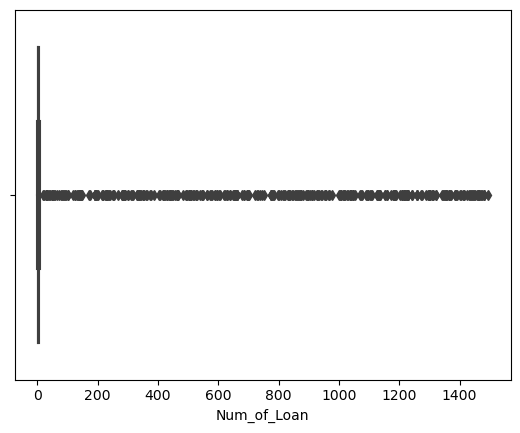

min 0.0 max 1495.0


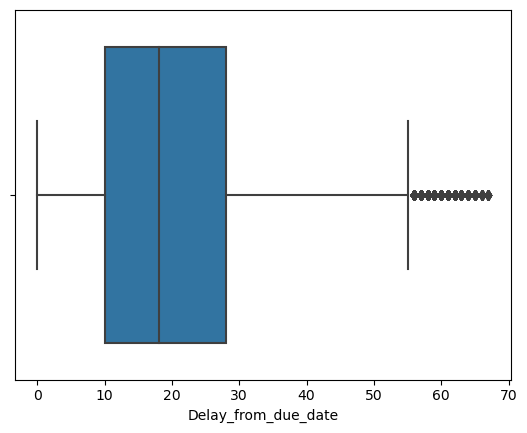

min 0.0 max 67.0


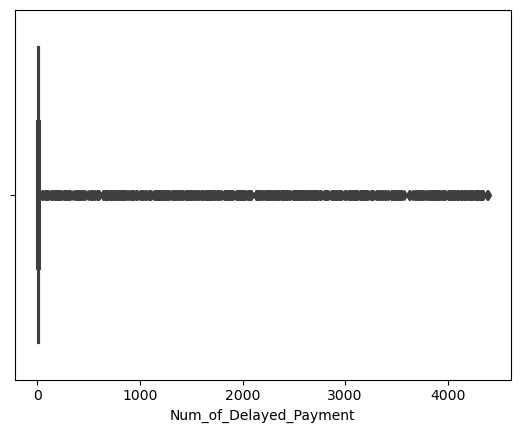

min 0.0 max 4397.0


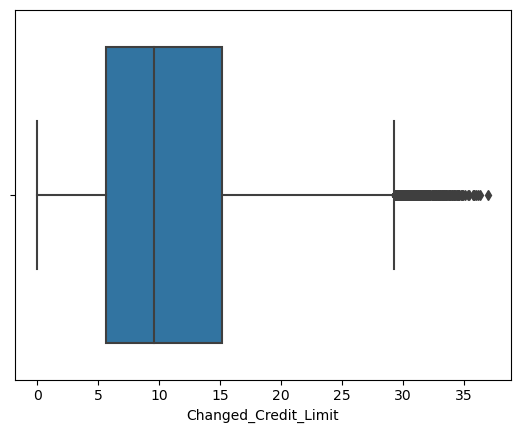

min 0.0 max 36.97


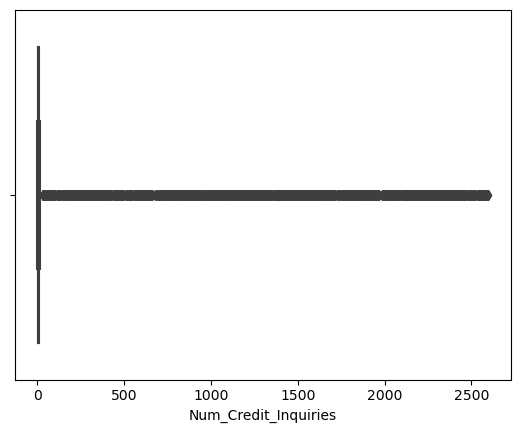

min 0.0 max 2597.0


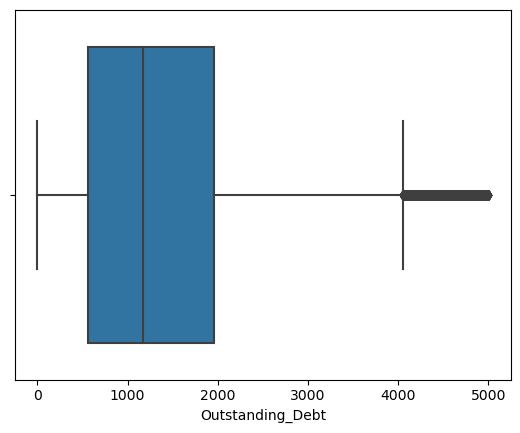

min 0.34 max 4998.07


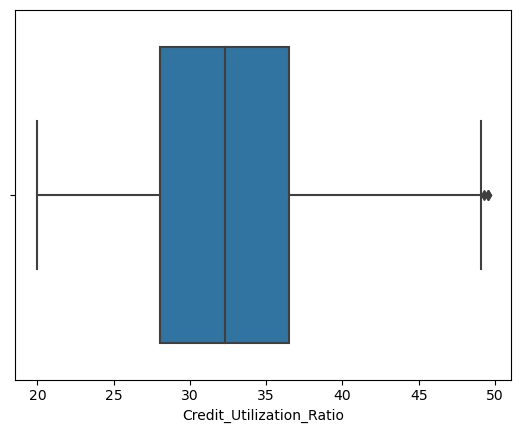

min 20.0 max 49.56


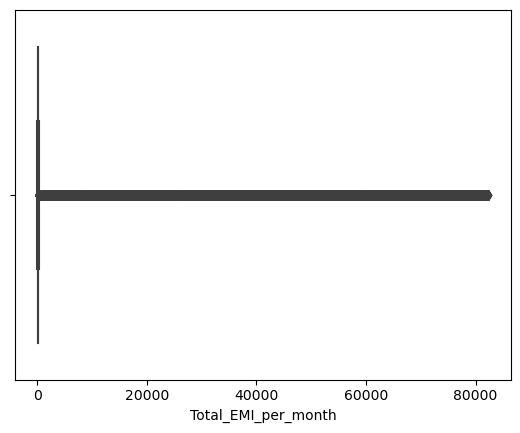

min 0.0 max 82331.0


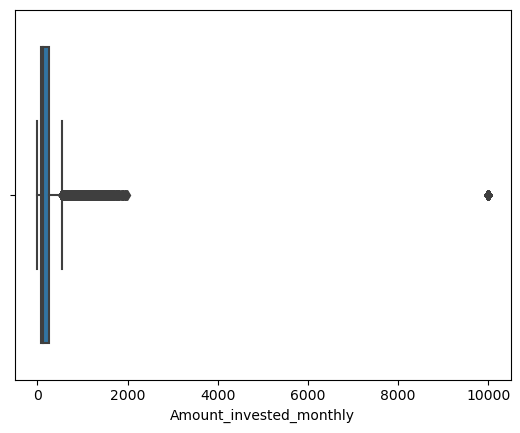

min 0.0 max 10000.0


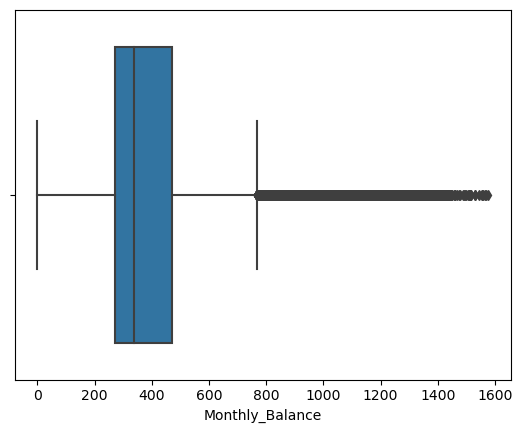

min 0.09 max 1576.29


In [88]:
for i in d1.select_dtypes(include=np.number):
    sns.boxplot(d1[i])
    plt.show()
    print('min',d1[i].min(), 'max',d1[i].max())

In [89]:
q1=d1.quantile(0.25)
q3=d1.quantile(0.75)
iqr=q3-q1
ll=q1-1.5*iqr
ul=q3+1.5*iqr
d1=d1[~((d1 < ll) |(d1 >ul)).any(axis=1)]
d1

,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
3,April,23.0,Scientist,19114.12,1824.84,3.0,4,3,4.0,"Auto Loan, Credit-Builder Loan, Personal Loan,...",5.0,4.0,6.27,4.0,Good,809.98,31.38,22 Years and 4 Months,No,49.57,199.46,Low_spent_Small_value_payments,223.45,Good
5,June,23.0,Scientist,19114.12,1824.84,3.0,4,3,4.0,"Auto Loan, Credit-Builder Loan, Personal Loan,...",8.0,4.0,9.27,4.0,Good,809.98,27.26,22 Years and 6 Months,No,49.57,62.43,Low_spent_Small_value_payments,340.48,Good
6,July,23.0,Scientist,19114.12,1824.84,3.0,4,3,4.0,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3.0,8.0,11.27,4.0,Good,809.98,22.54,22 Years and 7 Months,No,49.57,178.34,Low_spent_Small_value_payments,244.57,Good
7,August,23.0,Scientist,19114.12,1824.84,3.0,4,3,4.0,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3.0,6.0,11.27,4.0,Good,809.98,23.93,22 Years and 7 Months,No,49.57,24.79,High_spent_Medium_value_payments,358.12,Standard
9,February,28.0,Teacher,34847.84,3037.99,2.0,4,6,1.0,Credit-Builder Loan,7.0,1.0,7.42,2.0,Good,605.03,38.55,26 Years and 8 Months,No,18.82,40.39,High_spent_Large_value_payments,484.59,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99991,August,29.0,Architect,20002.88,1929.91,10.0,8,29,5.0,"Personal Loan, Auto Loan, Mortgage Loan, Stude...",33.0,25.0,18.31,9.0,Bad,3571.70,37.14,6 Years and 3 Months,Yes,60.96,34.66,High_spent_Large_value_payments,337.36,Standard
99994,March,25.0,Mechanic,39628.99,3359.42,4.0,6,7,2.0,"Auto Loan, and Student Loan",20.0,6.0,9.50,3.0,Good,502.38,39.32,31 Years and 5 Months,No,35.10,140.58,High_spent_Medium_value_payments,410.26,Poor
99995,April,25.0,Mechanic,39628.99,3359.42,4.0,6,7,2.0,"Auto Loan, and Student Loan",23.0,7.0,11.50,3.0,Good,502.38,34.66,31 Years and 6 Months,No,35.10,60.97,High_spent_Large_value_payments,479.87,Poor
99996,May,25.0,Mechanic,39628.99,3359.42,4.0,6,7,2.0,"Auto Loan, and Student Loan",18.0,7.0,11.50,3.0,Good,502.38,40.57,31 Years and 7 Months,No,35.10,54.19,High_spent_Medium_value_payments,496.65,Poor


In [90]:
d1.isnull().sum()

Month                       0
Age                         0
Occupation                  0
Annual_Income               0
Monthly_Inhand_Salary       0
Num_Bank_Accounts           0
Num_Credit_Card             0
Interest_Rate               0
Num_of_Loan                 0
Type_of_Loan                0
Delay_from_due_date         0
Num_of_Delayed_Payment      0
Changed_Credit_Limit        0
Num_Credit_Inquiries        0
Credit_Mix                  0
Outstanding_Debt            0
Credit_Utilization_Ratio    0
Credit_History_Age          0
Payment_of_Min_Amount       0
Total_EMI_per_month         0
Amount_invested_monthly     0
Payment_Behaviour           0
Monthly_Balance             0
Credit_Score                0
dtype: int64

In [91]:
ll

Age                             2.00000
Annual_Income              -59809.65500
Monthly_Inhand_Salary       -4820.61250
Num_Bank_Accounts              -2.00000
Num_Credit_Card                -0.50000
Interest_Rate                 -10.00000
Num_of_Loan                    -2.50000
Delay_from_due_date           -17.00000
Num_of_Delayed_Payment         -4.50000
Changed_Credit_Limit           -8.52500
Num_Credit_Inquiries           -6.00000
Outstanding_Debt            -1525.85500
Credit_Utilization_Ratio       15.41500
Total_EMI_per_month          -164.76125
Amount_invested_monthly      -211.84125
Monthly_Balance               -28.93125
dtype: float64

In [92]:
#according to iqr these numbers are perfect, but not according to project 

In [93]:
ul

Age                             66.00000
Annual_Income               151318.30500
Monthly_Inhand_Salary        12356.28750
Num_Bank_Accounts               14.00000
Num_Credit_Card                 11.50000
Interest_Rate                   38.00000
Num_of_Loan                      9.50000
Delay_from_due_date             55.00000
Num_of_Delayed_Payment          31.50000
Changed_Credit_Limit            29.27500
Num_Credit_Inquiries            18.00000
Outstanding_Debt              4052.26500
Credit_Utilization_Ratio        49.13500
Total_EMI_per_month            355.60875
Amount_invested_monthly        549.78875
Monthly_Balance                767.89875
dtype: float64

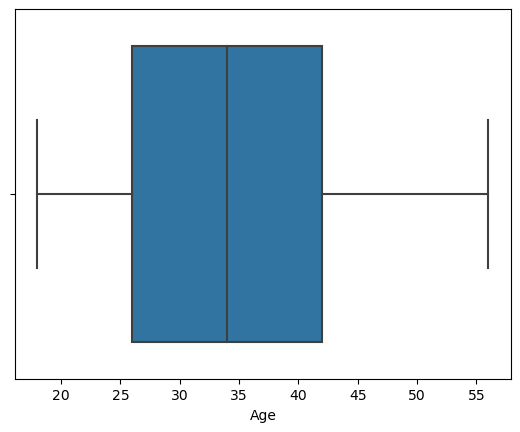

min 18.0 max 56.0
0.22871273114902646


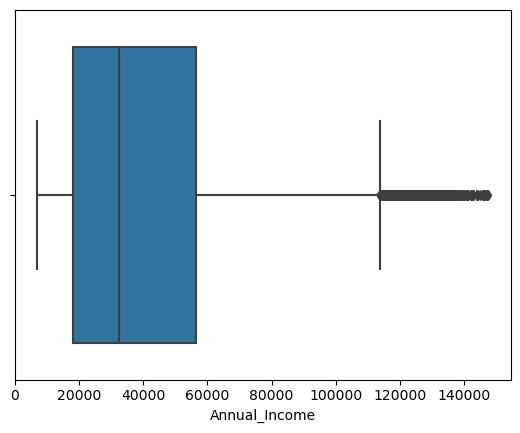

min 7006.04 max 147499.6
1.0804269584134292


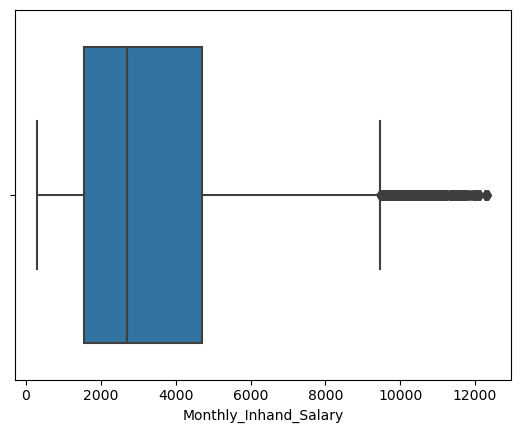

min 303.65 max 12353.63
1.0784351037309174


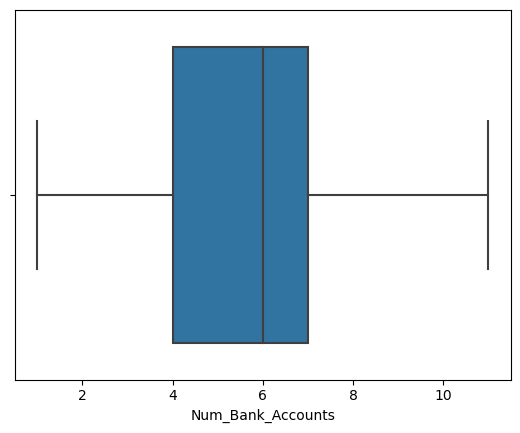

min 1.0 max 11.0
0.010716800148344391


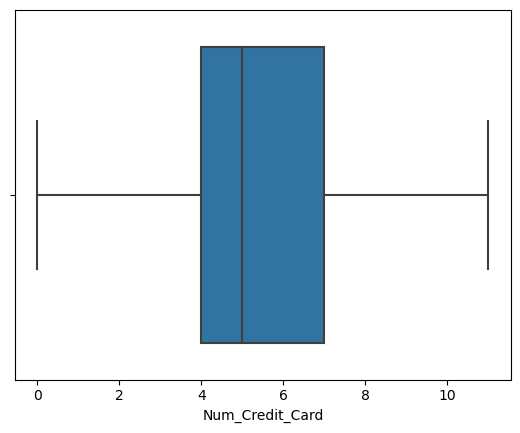

min 0 max 11
0.25798120942803976


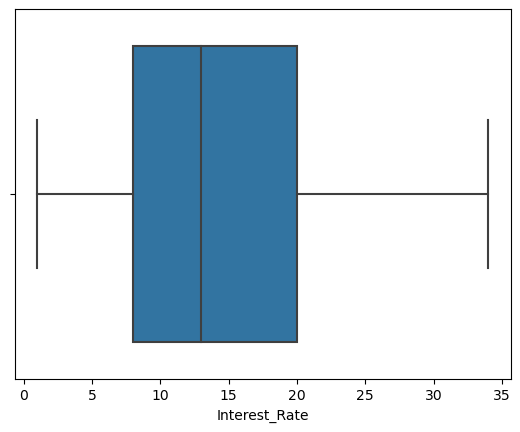

min 1 max 34
0.5223218444894716


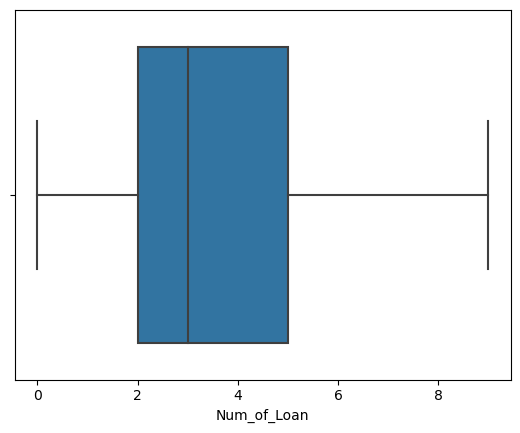

min 0.0 max 9.0
0.46132742127018117


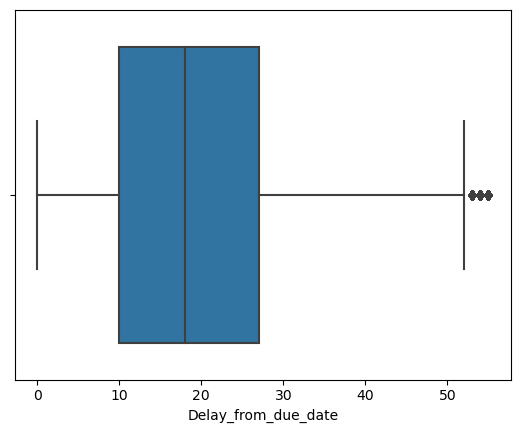

min 0.0 max 55.0
0.8272777131699892


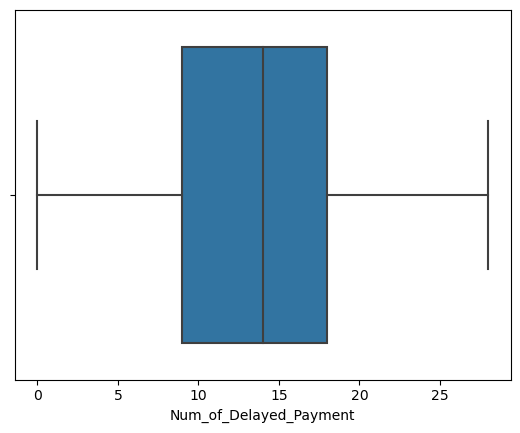

min 0.0 max 28.0
-0.19245585402214507


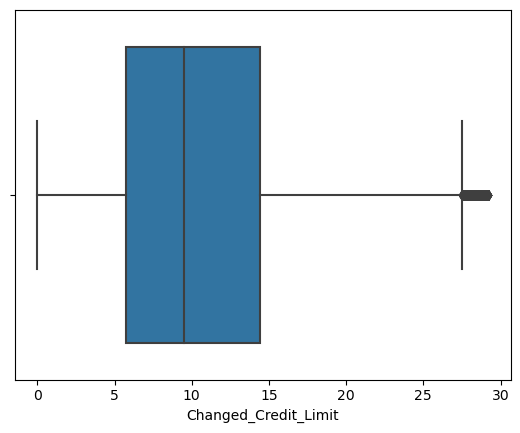

min 0.0 max 29.21
0.5767451467501802


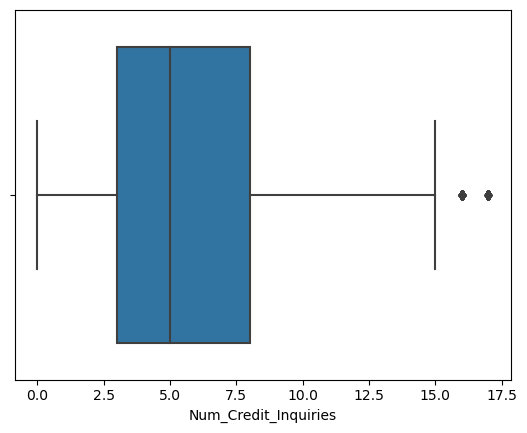

min 0.0 max 17.0
0.4168034173219189


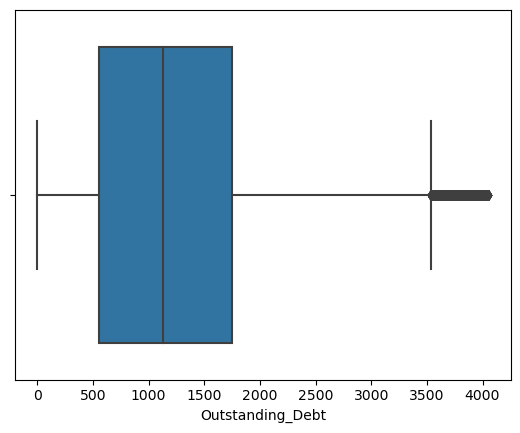

min 0.54 max 4051.83
0.8915454981891364


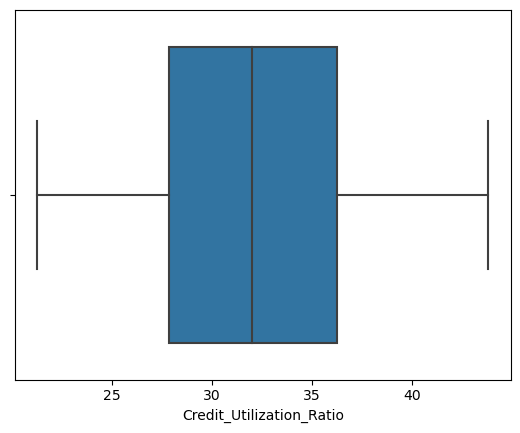

min 21.26 max 43.82
0.0031104237203793874


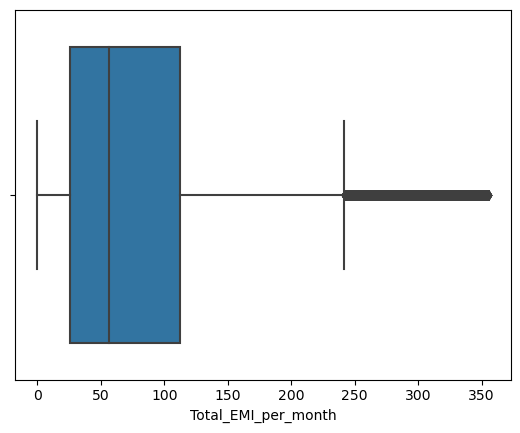

min 0.0 max 355.35
1.3466672230850552


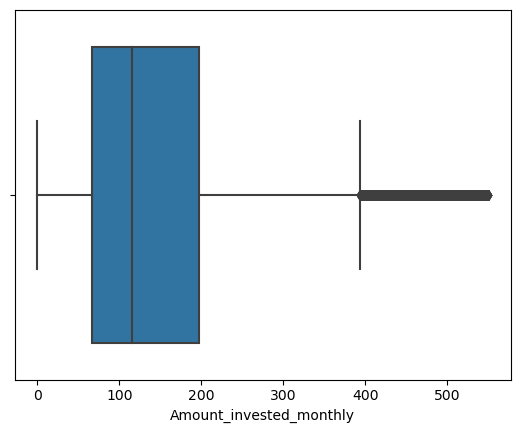

min 0.0 max 549.77
1.3590500361640023


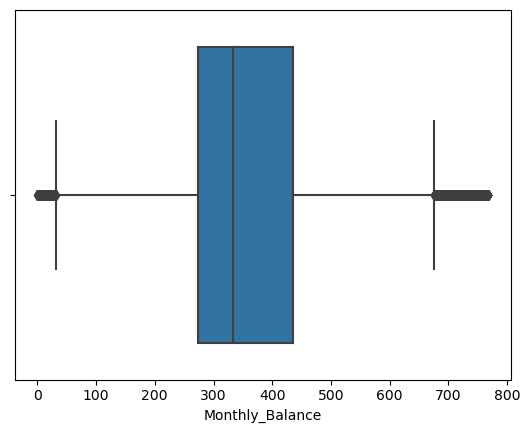

min 0.09 max 767.87
0.8789296100350632


In [94]:
for i in d1.select_dtypes(include=np.number):
    sns.boxplot(d1[i])
    plt.show()
    print('min',d1[i].min(), 'max',d1[i].max())
    print(d1[i].skew())

In [95]:
#2nd  Outlier treatment
#Annual__Income
median_income = d1['Annual_Income'].median()
condition = d1['Annual_Income'] >= 53000
d1.loc[condition, 'Annual_Income'] = median_income

In [96]:
#For Monthly_Inhand_Salary, we wont treat outlier, as i know Annual__Income and Monthly_Inhand_Salary are corrlated with each other, 
#so i will dropping one column after multicollinearity test, so i will keeping it for test

In [97]:
#Num_of_Loan
Num_of_Loan = d1['Num_of_Loan'].median()
condition1 = d1['Num_of_Loan'] >= 7
d1.loc[condition1, 'Num_of_Loan'] = Num_of_Loan

In [98]:
#Delay_from_due_date'
Delay_from_due_date = d1['Delay_from_due_date'].median()
condition2 = d1['Delay_from_due_date'] >= 46
d1.loc[condition2, 'Delay_from_due_date'] = Delay_from_due_date

In [99]:
#Changed_Credit_Limit
Changed_Credit_Limit = d1['Changed_Credit_Limit'].median()
condition4 = d1['Changed_Credit_Limit'] >= 25
d1.loc[condition4, 'Changed_Credit_Limit'] = Changed_Credit_Limit

In [100]:
#Outstanding_Debt
Outstanding_Debt = d1['Outstanding_Debt'].median()
condition5 = d1['Outstanding_Debt'] >= 2750
d1.loc[condition5, 'Outstanding_Debt'] = Outstanding_Debt

In [101]:
#Total_EMI_per_month
Total_EMI_per_month = d1['Total_EMI_per_month'].median()
condition6 = d1['Total_EMI_per_month'] >= 80
d1.loc[condition6, 'Total_EMI_per_month'] = Total_EMI_per_month

In [102]:
#Amount_invested_monthly
Amount_invested_monthly = d1['Amount_invested_monthly'].median()
condition7 = d1['Amount_invested_monthly'] >= 230
d1.loc[condition7, 'Amount_invested_monthly'] = Amount_invested_monthly

In [103]:
#Num_Credit_Inquiries
Num_Credit_Inquiries = d1['Num_Credit_Inquiries'].median()
condition8 = d1['Num_Credit_Inquiries'] >= 15
d1.loc[condition8, 'Num_Credit_Inquiries'] = Num_Credit_Inquiries

In [104]:
#Amount_invested_monthly
Amount_invested_monthly = d1['Amount_invested_monthly'].median()
condition9 = d1['Amount_invested_monthly'] >= 175
d1.loc[condition9, 'Amount_invested_monthly'] = Amount_invested_monthly

In [105]:
#Monthly_Balance
Monthly_Balance = d1['Monthly_Balance'].median()
condition10 = d1['Monthly_Balance'] >= 430
d1.loc[condition10, 'Monthly_Balance'] = Monthly_Balance

In [106]:
#Monthly_Balance
Monthly_Balance = d1['Monthly_Balance'].median()
condition11 = d1['Monthly_Balance'] <= 160
d1.loc[condition11, 'Monthly_Balance'] = Monthly_Balance

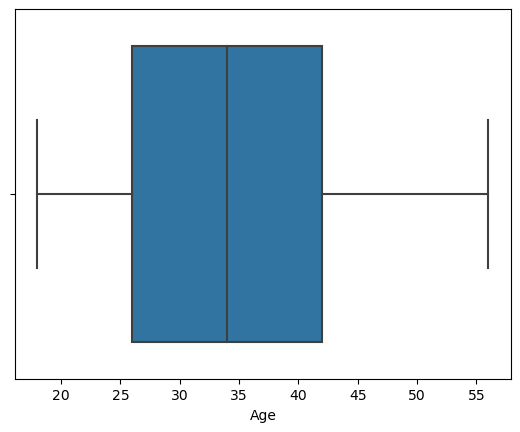

min 18.0 max 56.0
0.22871273114902646


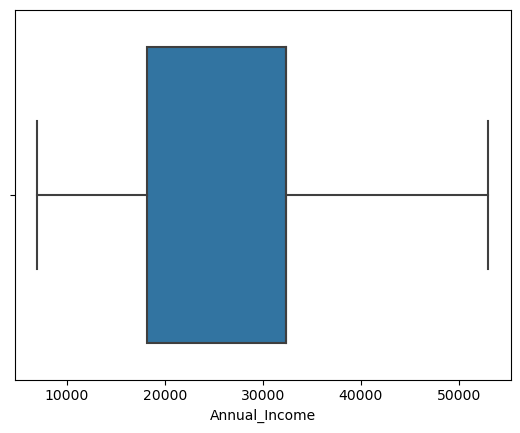

min 7006.04 max 52984.53
-0.09147638544696751


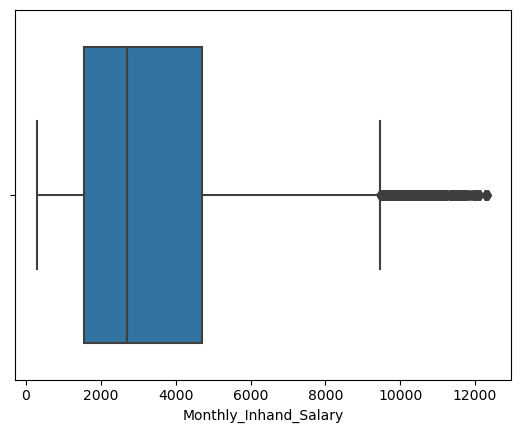

min 303.65 max 12353.63
1.0784351037309174


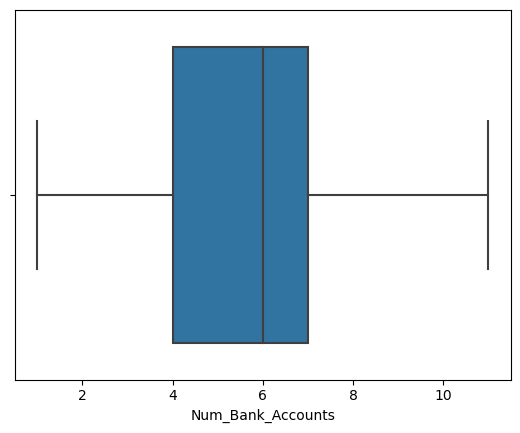

min 1.0 max 11.0
0.010716800148344391


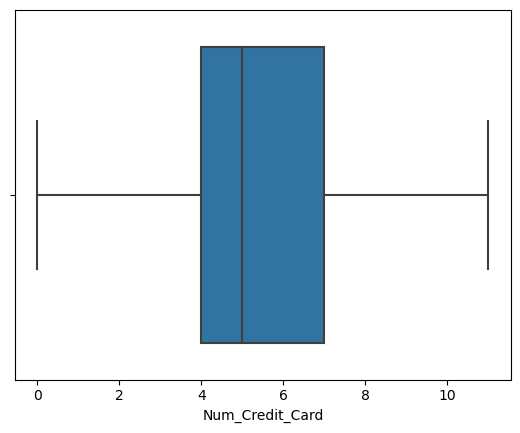

min 0 max 11
0.25798120942803976


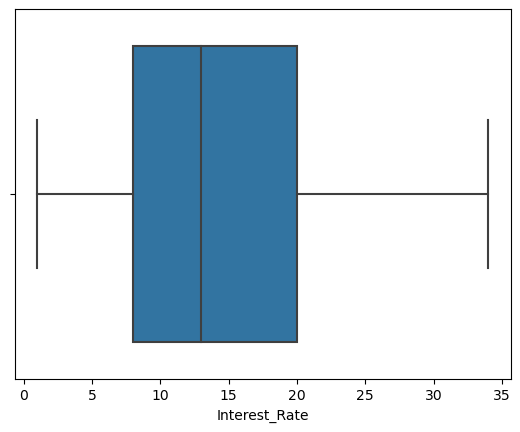

min 1 max 34
0.5223218444894716


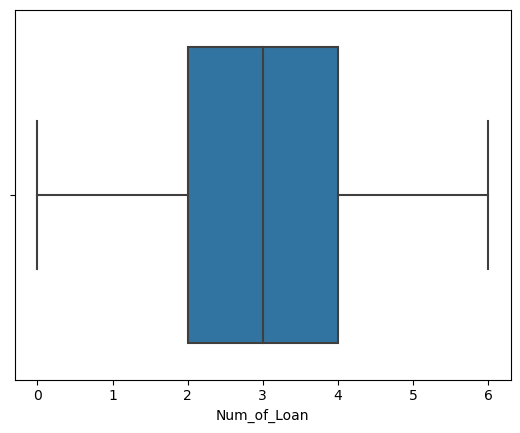

min 0.0 max 6.0
0.035768164954911474


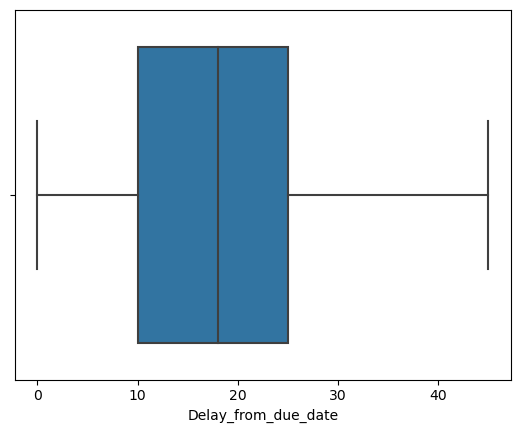

min 0.0 max 45.0
0.45224088744405994


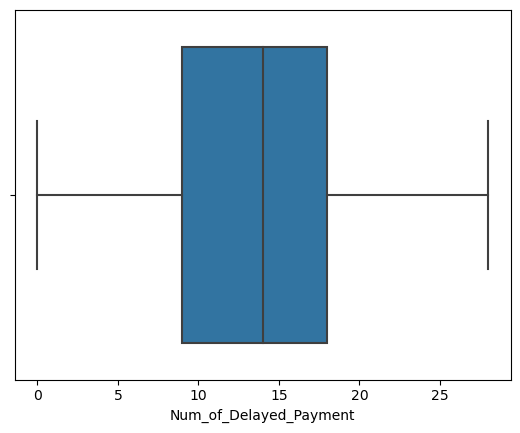

min 0.0 max 28.0
-0.19245585402214507


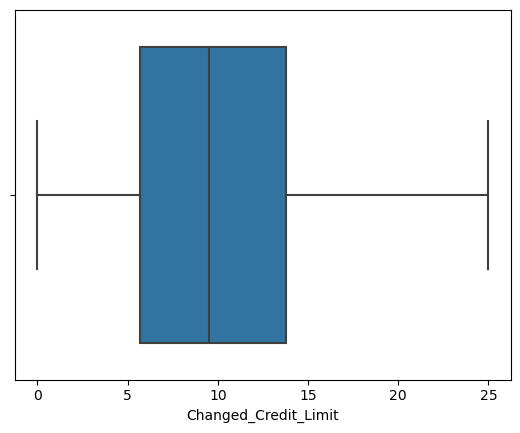

min 0.0 max 24.99
0.3642535993220313


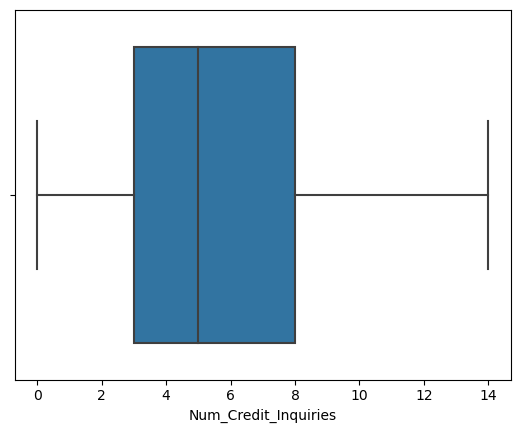

min 0.0 max 14.0
0.31137961342148335


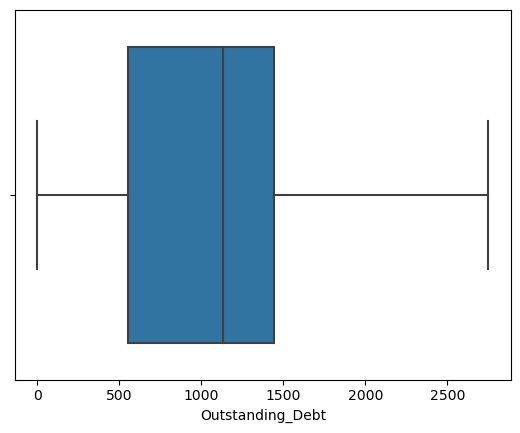

min 0.54 max 2749.73
0.4950281677908836


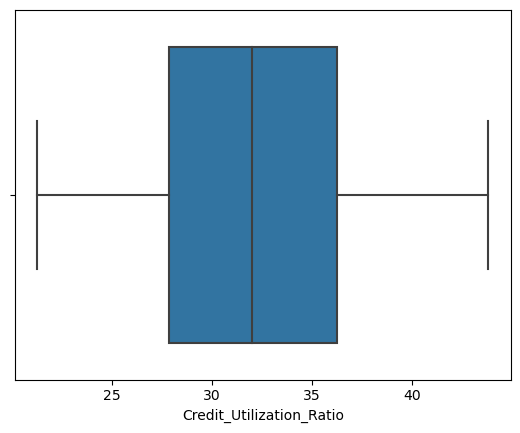

min 21.26 max 43.82
0.0031104237203793874


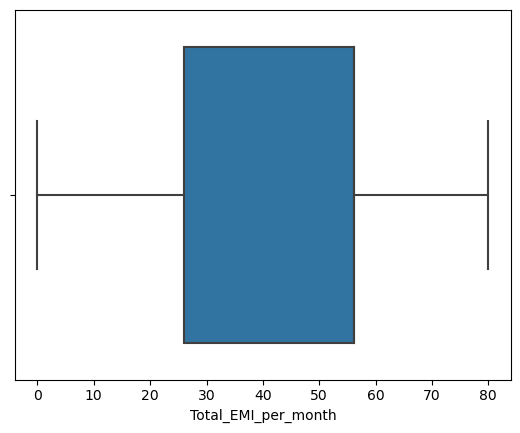

min 0.0 max 79.99
-0.6812061619620886


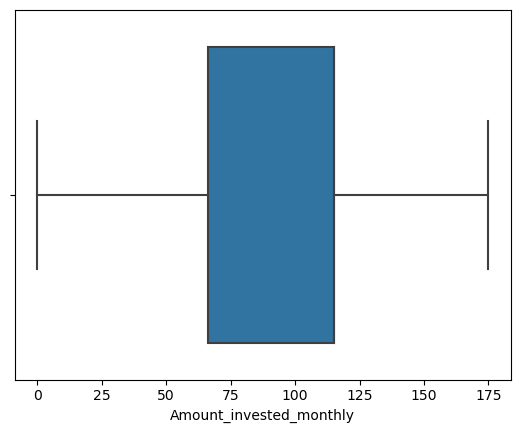

min 0.0 max 174.98
-0.31567736108198957


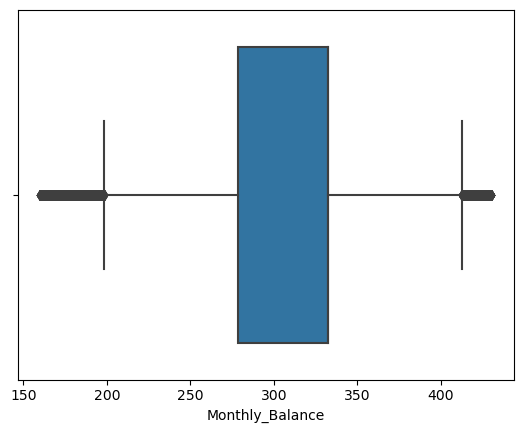

min 160.02 max 429.99
-0.3703728702587072


In [107]:
for i in d1.select_dtypes(include=np.number):
    sns.boxplot(d1[i])
    plt.show()
    print('min',d1[i].min(), 'max',d1[i].max())
    print(d1[i].skew())

In [108]:
d1.shape

(46055, 24)

In [109]:
(d1["Credit_Score"].value_counts(normalize=True).sort_index())*100

Good        15.794159
Poor        28.617957
Standard    55.587884
Name: Credit_Score, dtype: float64

# Univariate Analysis

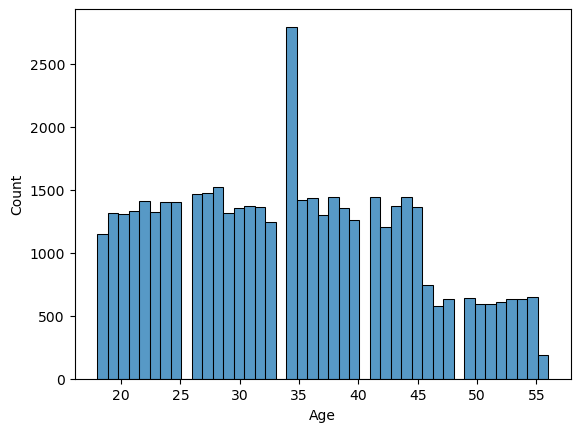

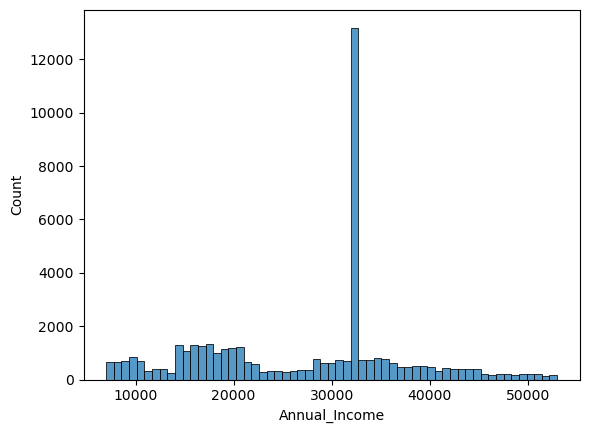

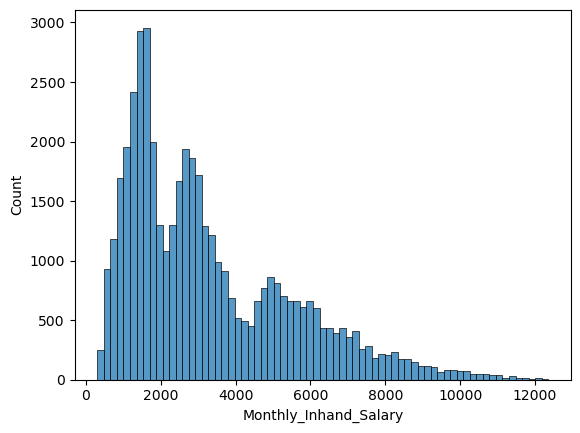

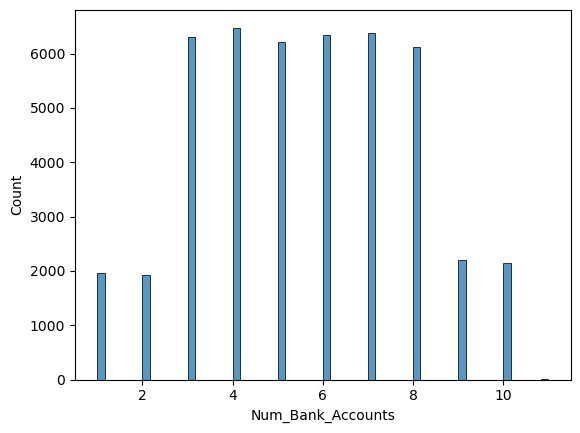

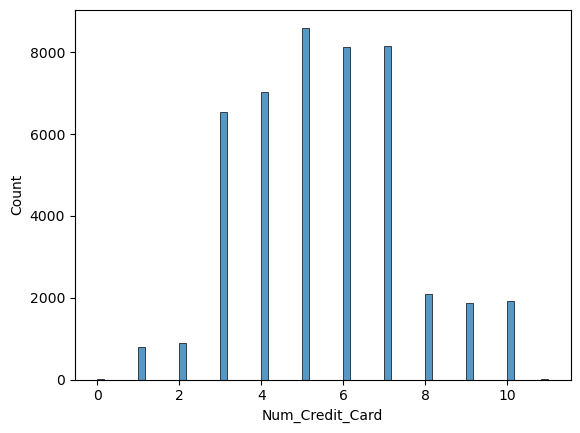

...

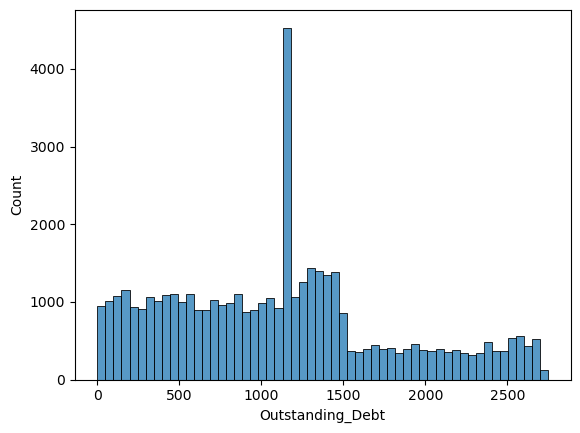

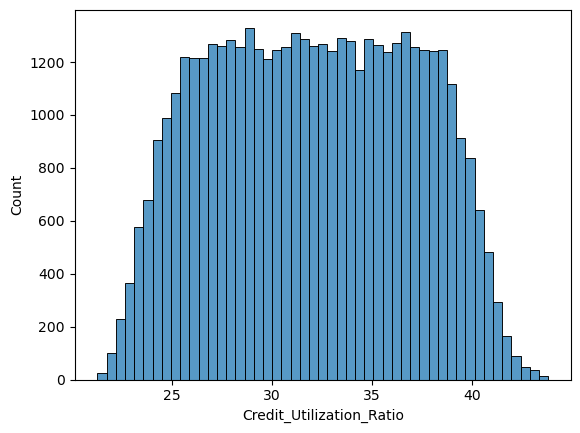

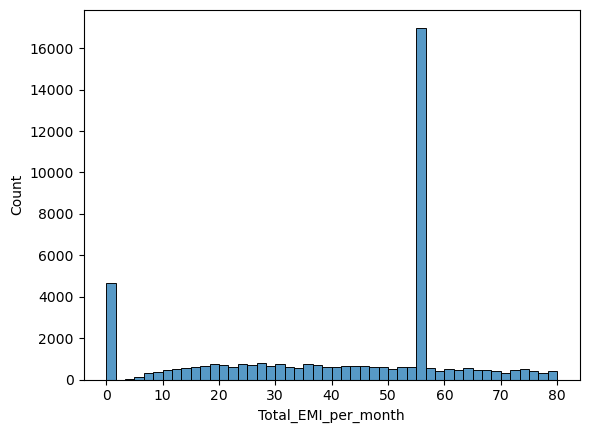

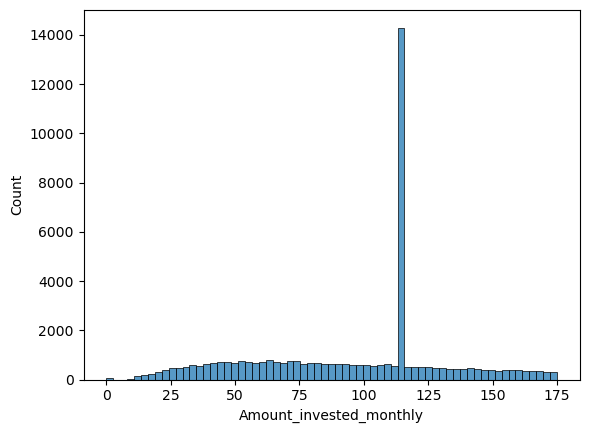

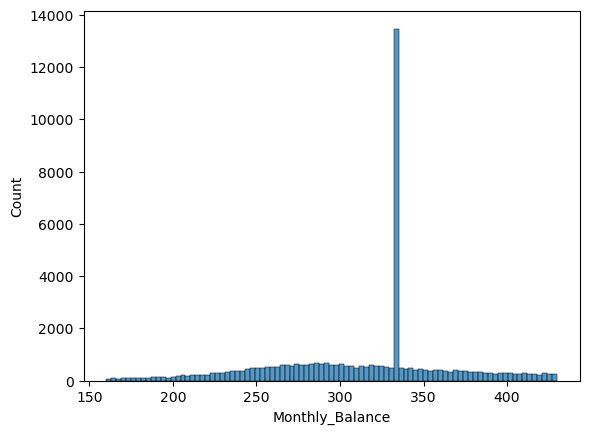

In [110]:
for i in d1.select_dtypes(include=np.number):
    sns.histplot(d1[i])
    plt.show()

<AxesSubplot:xlabel='Credit_Score', ylabel='count'>

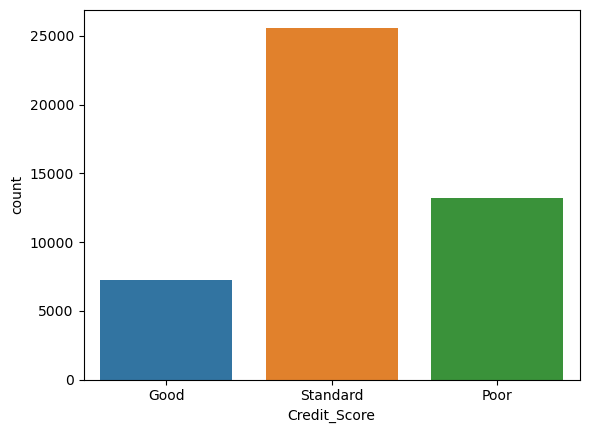

In [111]:
sns.countplot(d1['Credit_Score'])

<AxesSubplot:xlabel='Month', ylabel='count'>

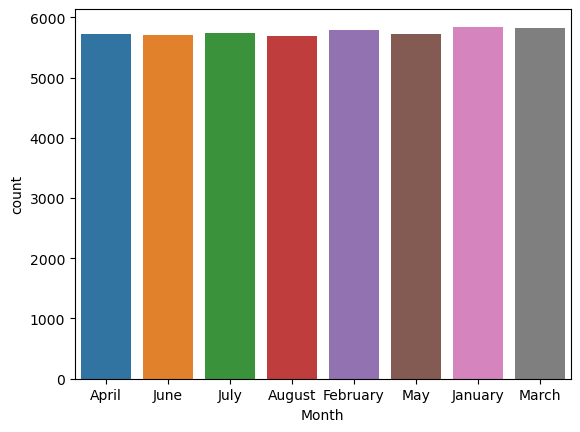

In [112]:
sns.countplot(x=d1["Month"])

In [113]:
d1

,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
3,April,23.0,Scientist,19114.12,1824.84,3.0,4,3,4.0,"Auto Loan, Credit-Builder Loan, Personal Loan,...",5.0,4.0,6.27,4.0,Good,809.98,31.38,22 Years and 4 Months,No,49.57,114.95,Low_spent_Small_value_payments,223.45,Good
5,June,23.0,Scientist,19114.12,1824.84,3.0,4,3,4.0,"Auto Loan, Credit-Builder Loan, Personal Loan,...",8.0,4.0,9.27,4.0,Good,809.98,27.26,22 Years and 6 Months,No,49.57,62.43,Low_spent_Small_value_payments,340.48,Good
6,July,23.0,Scientist,19114.12,1824.84,3.0,4,3,4.0,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3.0,8.0,11.27,4.0,Good,809.98,22.54,22 Years and 7 Months,No,49.57,114.95,Low_spent_Small_value_payments,244.57,Good
7,August,23.0,Scientist,19114.12,1824.84,3.0,4,3,4.0,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3.0,6.0,11.27,4.0,Good,809.98,23.93,22 Years and 7 Months,No,49.57,24.79,High_spent_Medium_value_payments,358.12,Standard
9,February,28.0,Teacher,34847.84,3037.99,2.0,4,6,1.0,Credit-Builder Loan,7.0,1.0,7.42,2.0,Good,605.03,38.55,26 Years and 8 Months,No,18.82,40.39,High_spent_Large_value_payments,332.31,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99991,August,29.0,Architect,20002.88,1929.91,10.0,8,29,5.0,"Personal Loan, Auto Loan, Mortgage Loan, Stude...",33.0,25.0,18.31,9.0,Bad,1133.21,37.14,6 Years and 3 Months,Yes,60.96,34.66,High_spent_Large_value_payments,337.36,Standard
99994,March,25.0,Mechanic,39628.99,3359.42,4.0,6,7,2.0,"Auto Loan, and Student Loan",20.0,6.0,9.50,3.0,Good,502.38,39.32,31 Years and 5 Months,No,35.10,140.58,High_spent_Medium_value_payments,410.26,Poor
99995,April,25.0,Mechanic,39628.99,3359.42,4.0,6,7,2.0,"Auto Loan, and Student Loan",23.0,7.0,11.50,3.0,Good,502.38,34.66,31 Years and 6 Months,No,35.10,60.97,High_spent_Large_value_payments,332.31,Poor
99996,May,25.0,Mechanic,39628.99,3359.42,4.0,6,7,2.0,"Auto Loan, and Student Loan",18.0,7.0,11.50,3.0,Good,502.38,40.57,31 Years and 7 Months,No,35.10,54.19,High_spent_Medium_value_payments,332.31,Poor


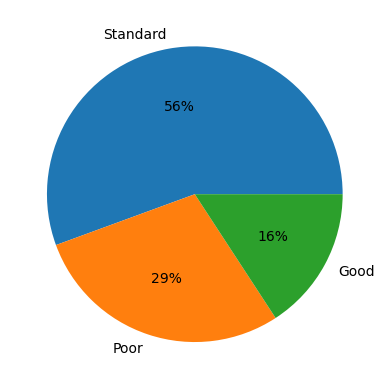

In [114]:
def target_ratio(df=d1,target='Credit_Score'):

    if not target:
        plt.pie(df.value_counts(),labels=df.value_counts()
                .index,autopct='%.0f%%')

    else:
        plt.pie(df[target].value_counts(),labels=df[target]
                .value_counts().index,autopct='%.0f%%')

target_ratio()

<AxesSubplot:xlabel='Occupation', ylabel='count'>

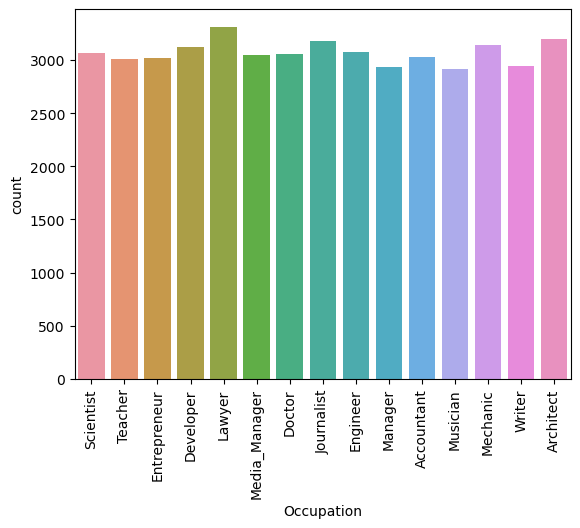

In [115]:
plt.xticks(rotation=90)
sns.countplot(x=d1["Occupation"])

<AxesSubplot:xlabel='Credit_Mix', ylabel='count'>

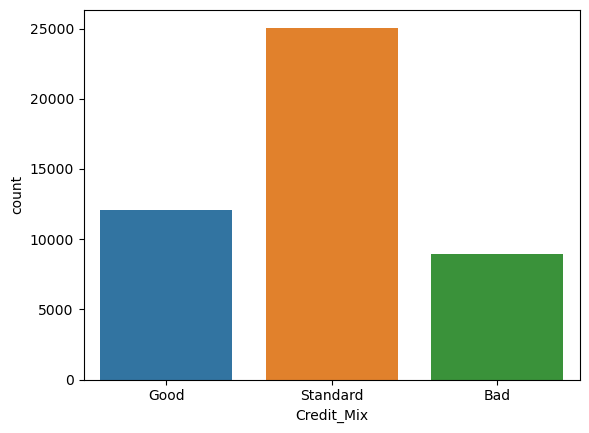

In [116]:
sns.countplot(x=d1["Credit_Mix"])

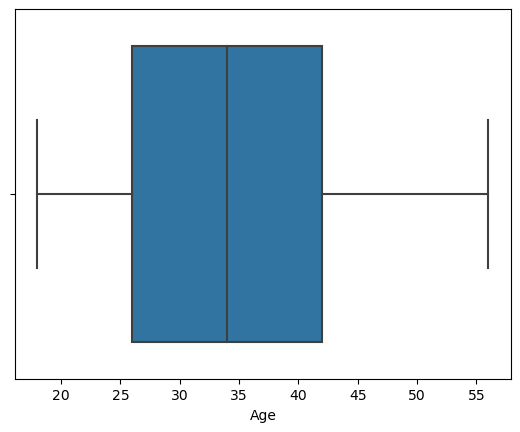

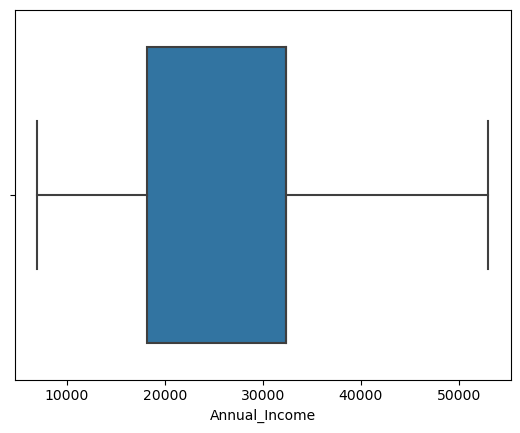

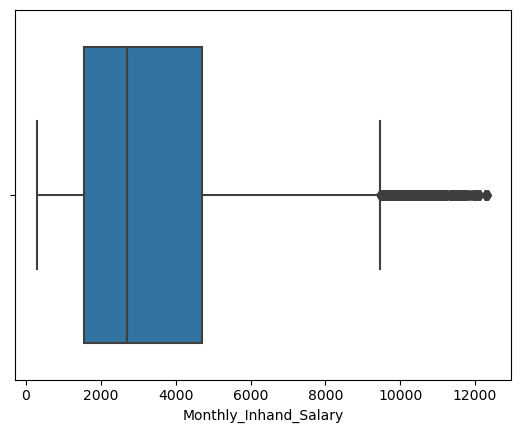

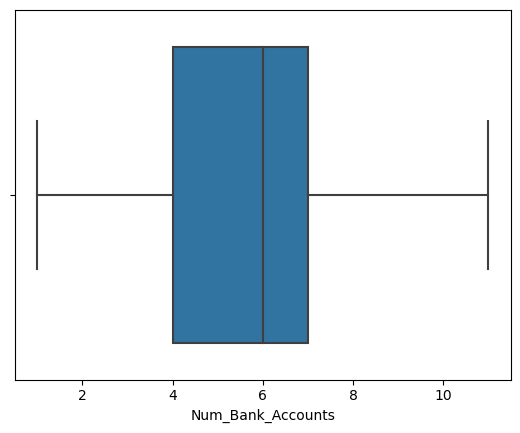

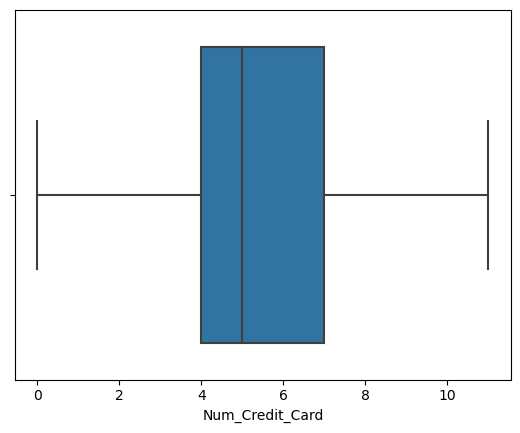

...

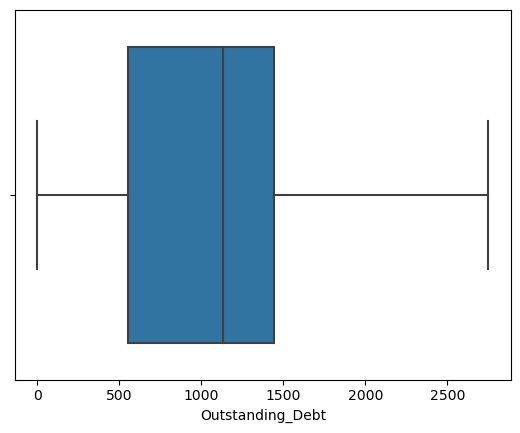

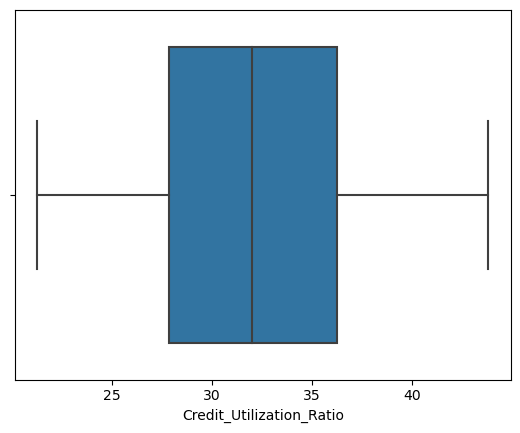

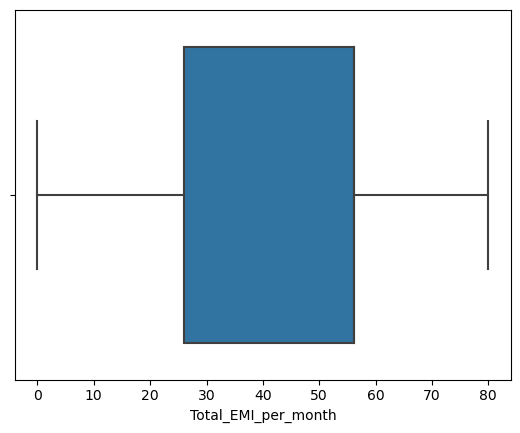

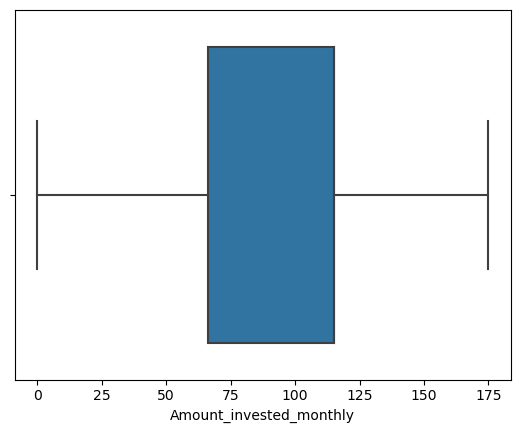

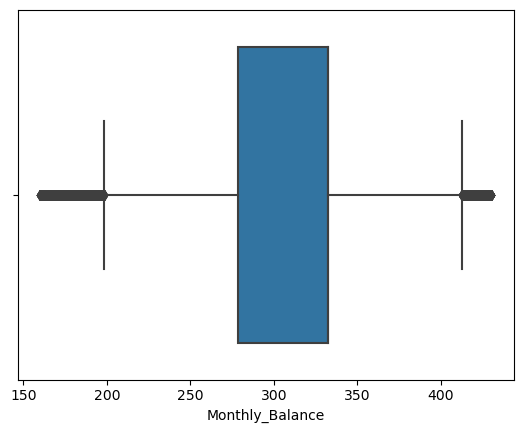

In [117]:
for i in d1.select_dtypes(include=np.number):
    sns.boxplot(d1[i])
    plt.show()

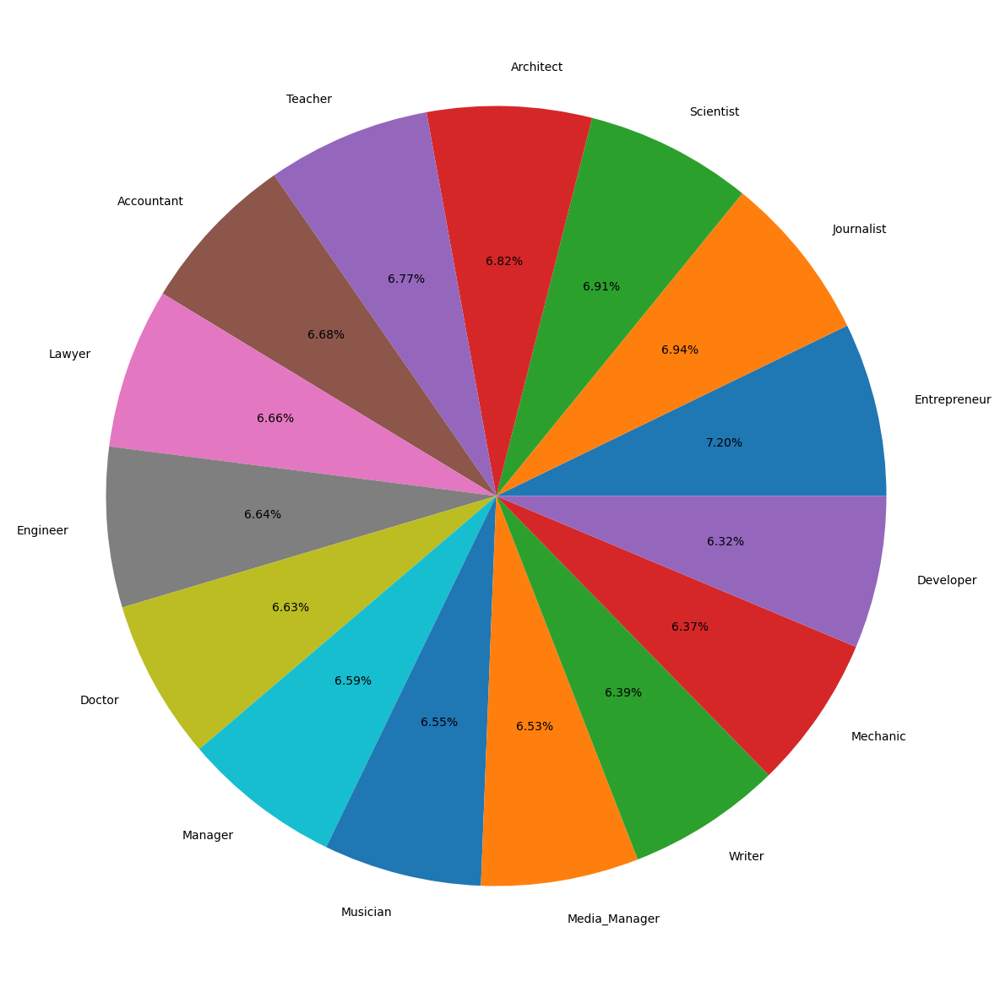

In [118]:
Occupation = d1['Occupation'].value_counts().tolist()
labels = d1['Occupation'].values.tolist()
labels = list(set(labels))
plt.figure(figsize = (15,15))
plt.pie(Occupation, labels = labels, autopct = '%1.2f%%')
plt.show()

In [119]:
d1.select_dtypes('object').describe().T

,count,unique,top,freq
Month,46055,8,January,5845
Occupation,46055,15,Lawyer,3314
Type_of_Loan,46055,4699,Not_Specified,4774
Credit_Mix,46055,3,Standard,25069
Credit_History_Age,46055,404,17 Years and 11 Months,260
Payment_of_Min_Amount,46055,3,Yes,24997
Payment_Behaviour,46055,6,Low_spent_Small_value_payments,15953
Credit_Score,46055,3,Standard,25601


# Multicollinearity Treatment

<AxesSubplot:>

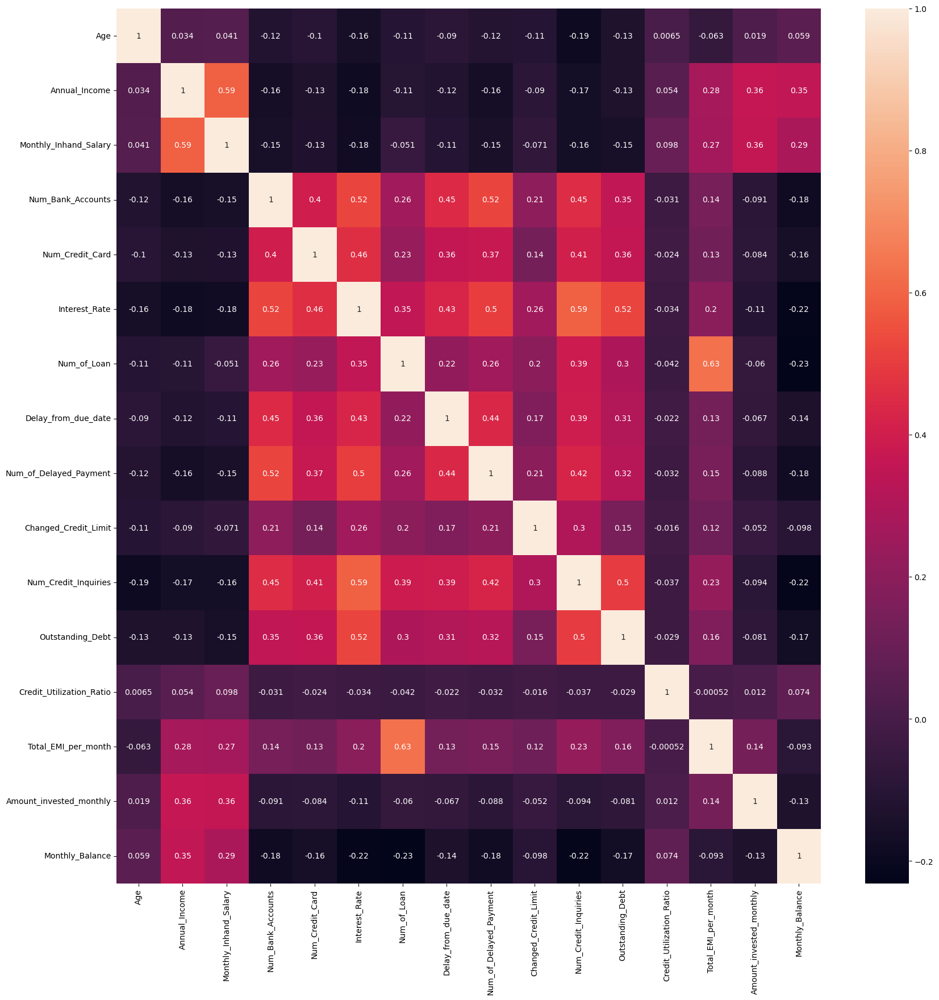

In [120]:
plt.figure(figsize=(20,20))
sns.heatmap(d1.corr(), annot=True)

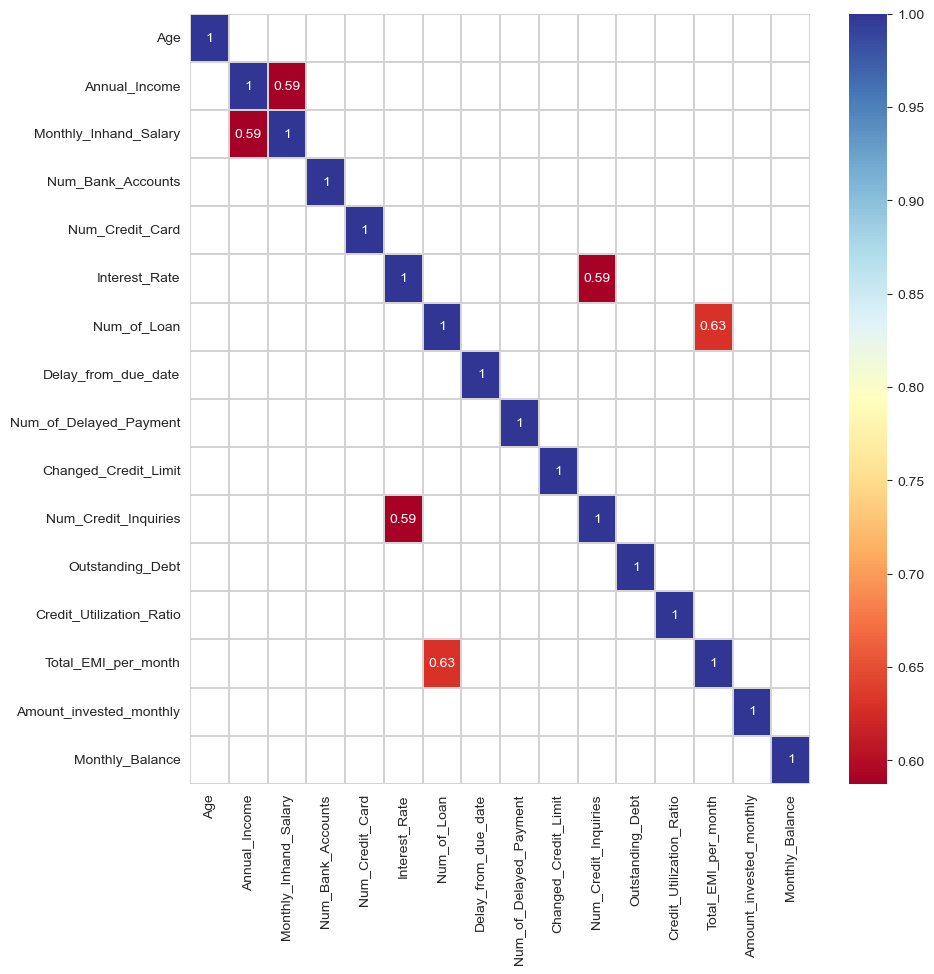

In [121]:
threshold = 0.54
plt.figure(figsize=(10,10))

sns.set_style("whitegrid", {"axes.facecolor": ".0"})
df_cluster2 = d1.corr()
mask = df_cluster2.where((abs(df_cluster2) >= threshold)).isna()
plot_kws={"s": 1}
sns.heatmap(df_cluster2,
            cmap='RdYlBu',
            annot=True,
            mask=mask,
            linewidths=0.2, 
            linecolor='lightgrey').set_facecolor('white')

'Monthly_Balance', 'Annual_Income', 'Monthly_Inhand_Salary' has correlation among each other., so we are dropping certain columns

In [122]:
d1.drop(columns=['Monthly_Balance'], inplace=True)

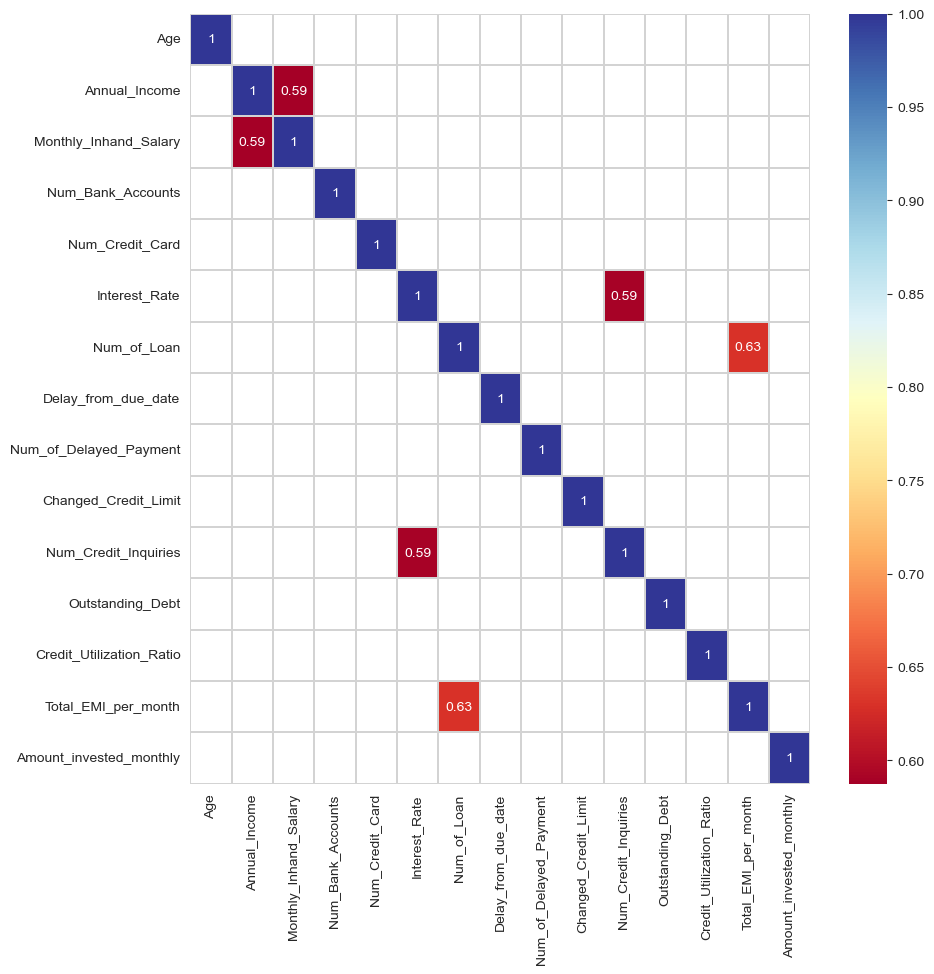

In [123]:
threshold = 0.54
plt.figure(figsize=(10,10))

sns.set_style("whitegrid", {"axes.facecolor": ".0"})
df_cluster2 = d1.corr()
mask = df_cluster2.where((abs(df_cluster2) >= threshold)).isna()
plot_kws={"s": 1}
sns.heatmap(df_cluster2,
            cmap='RdYlBu',
            annot=True,
            mask=mask,
            linewidths=0.2, 
            linecolor='lightgrey').set_facecolor('white')

In [ ]:
d1.drop(columns=['Monthly_Inhand_Salary'], inplace=True)

In [ ]:
d1.drop(columns=['Num_of_Loan'], inplace=True)

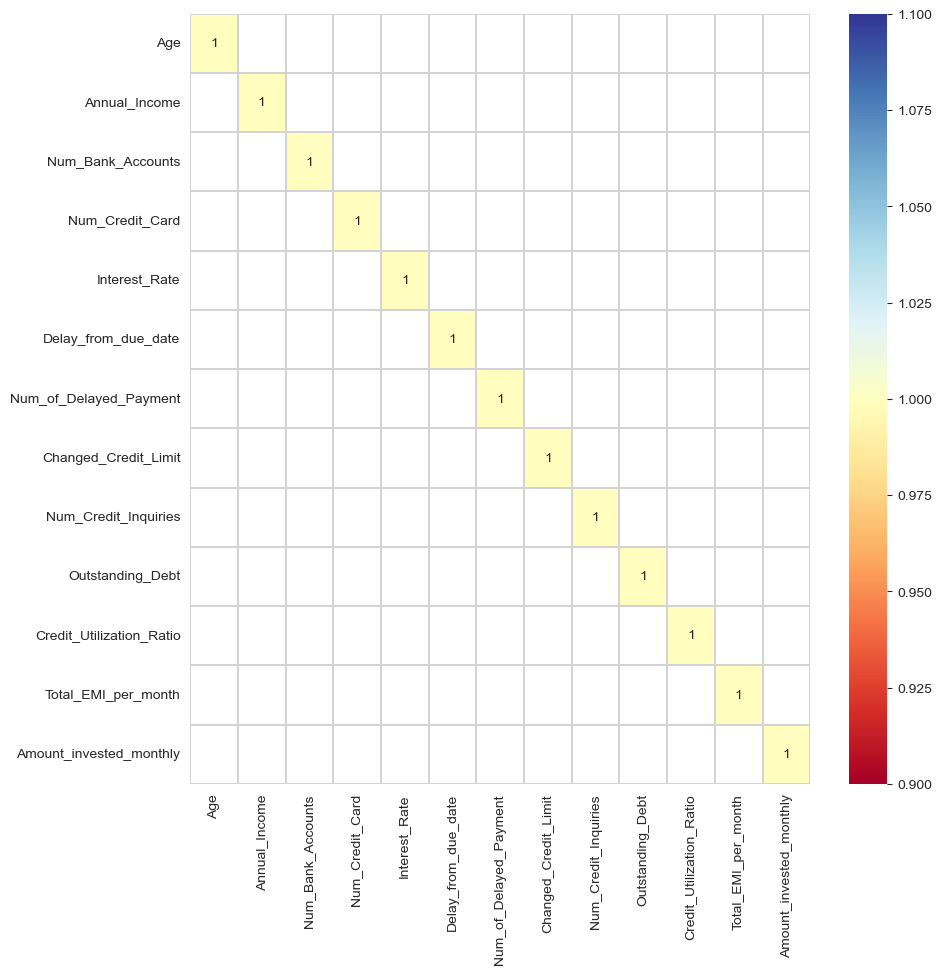

In [129]:
threshold = 0.6
plt.figure(figsize=(10,10))

sns.set_style("whitegrid", {"axes.facecolor": ".0"})
df_cluster2 = d1.corr()
mask = df_cluster2.where((abs(df_cluster2) >= threshold)).isna()
plot_kws={"s": 1}
sns.heatmap(df_cluster2,
            cmap='RdYlBu',
            annot=True,
            mask=mask,
            linewidths=0.2, 
            linecolor='lightgrey').set_facecolor('white')

In [130]:
#now dataset free of multicollinearity

In [131]:
del d1['Payment_Behaviour'] # bcs data, has inconvience values

In [132]:
del d1['Type_of_Loan'] # bcs data, has inconvience values

In [133]:
d1

,Month,Age,Occupation,Annual_Income,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Credit_Score
3,April,23.0,Scientist,19114.12,3.0,4,3,5.0,4.0,6.27,4.0,Good,809.98,31.38,22 Years and 4 Months,No,49.57,114.95,Good
5,June,23.0,Scientist,19114.12,3.0,4,3,8.0,4.0,9.27,4.0,Good,809.98,27.26,22 Years and 6 Months,No,49.57,62.43,Good
6,July,23.0,Scientist,19114.12,3.0,4,3,3.0,8.0,11.27,4.0,Good,809.98,22.54,22 Years and 7 Months,No,49.57,114.95,Good
7,August,23.0,Scientist,19114.12,3.0,4,3,3.0,6.0,11.27,4.0,Good,809.98,23.93,22 Years and 7 Months,No,49.57,24.79,Standard
9,February,28.0,Teacher,34847.84,2.0,4,6,7.0,1.0,7.42,2.0,Good,605.03,38.55,26 Years and 8 Months,No,18.82,40.39,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99991,August,29.0,Architect,20002.88,10.0,8,29,33.0,25.0,18.31,9.0,Bad,1133.21,37.14,6 Years and 3 Months,Yes,60.96,34.66,Standard
99994,March,25.0,Mechanic,39628.99,4.0,6,7,20.0,6.0,9.50,3.0,Good,502.38,39.32,31 Years and 5 Months,No,35.10,140.58,Poor
99995,April,25.0,Mechanic,39628.99,4.0,6,7,23.0,7.0,11.50,3.0,Good,502.38,34.66,31 Years and 6 Months,No,35.10,60.97,Poor
99996,May,25.0,Mechanic,39628.99,4.0,6,7,18.0,7.0,11.50,3.0,Good,502.38,40.57,31 Years and 7 Months,No,35.10,54.19,Poor


# Bivariate and Multi-Variate Analysis

<AxesSubplot:>

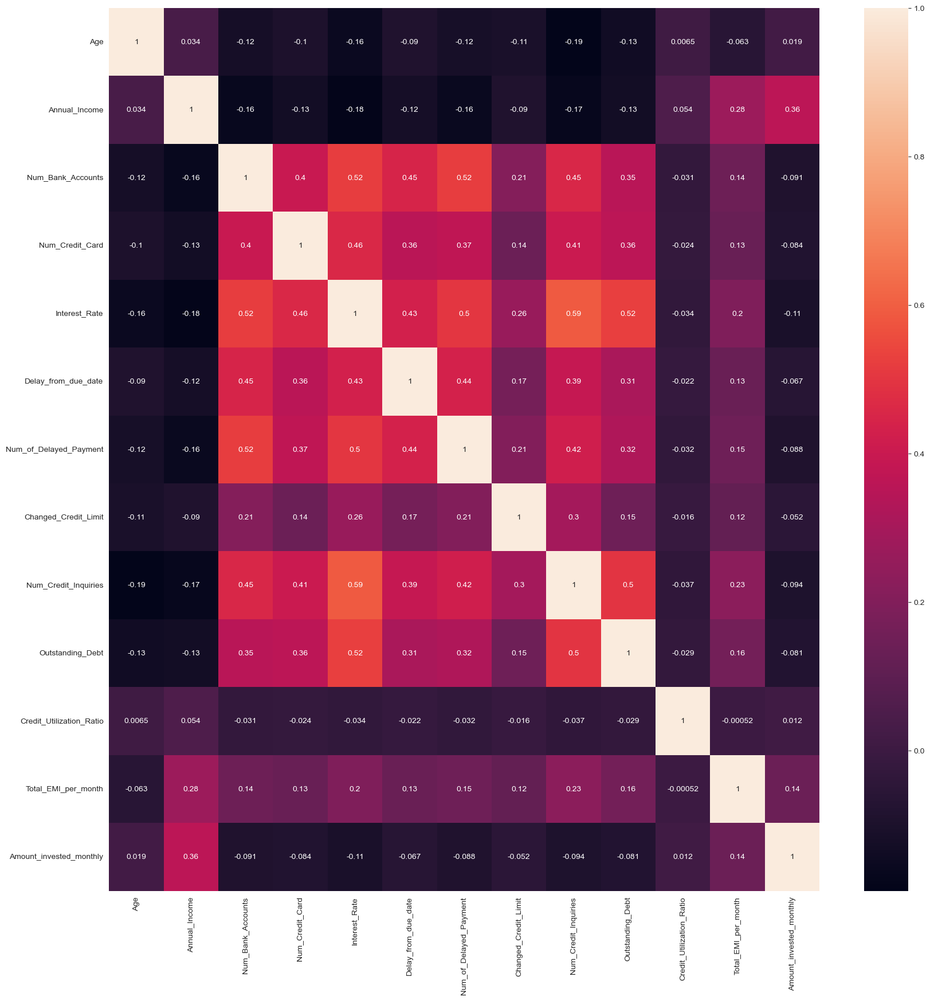

In [134]:
plt.figure(figsize=(20,20))
sns.heatmap(d1.corr(), annot=True)

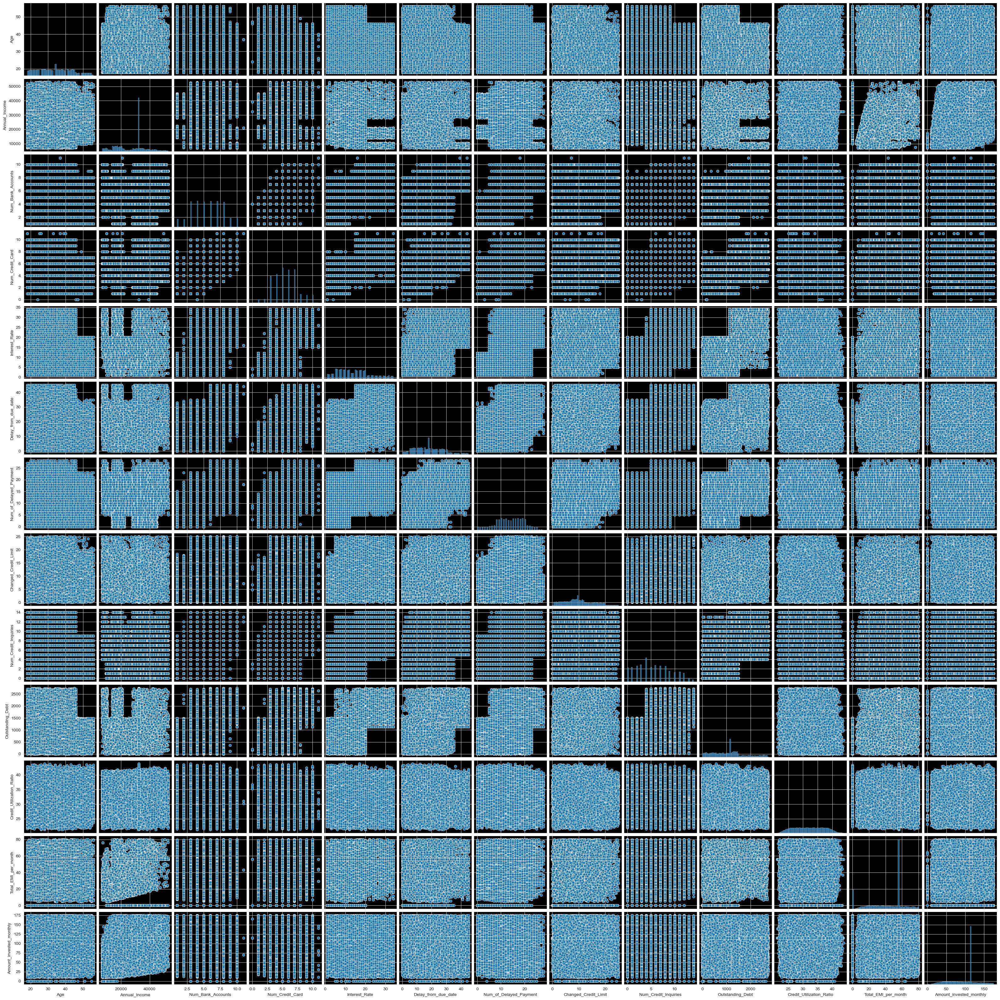

In [135]:
sns.pairplot(d1)

<Figure size 2000x2000 with 0 Axes>

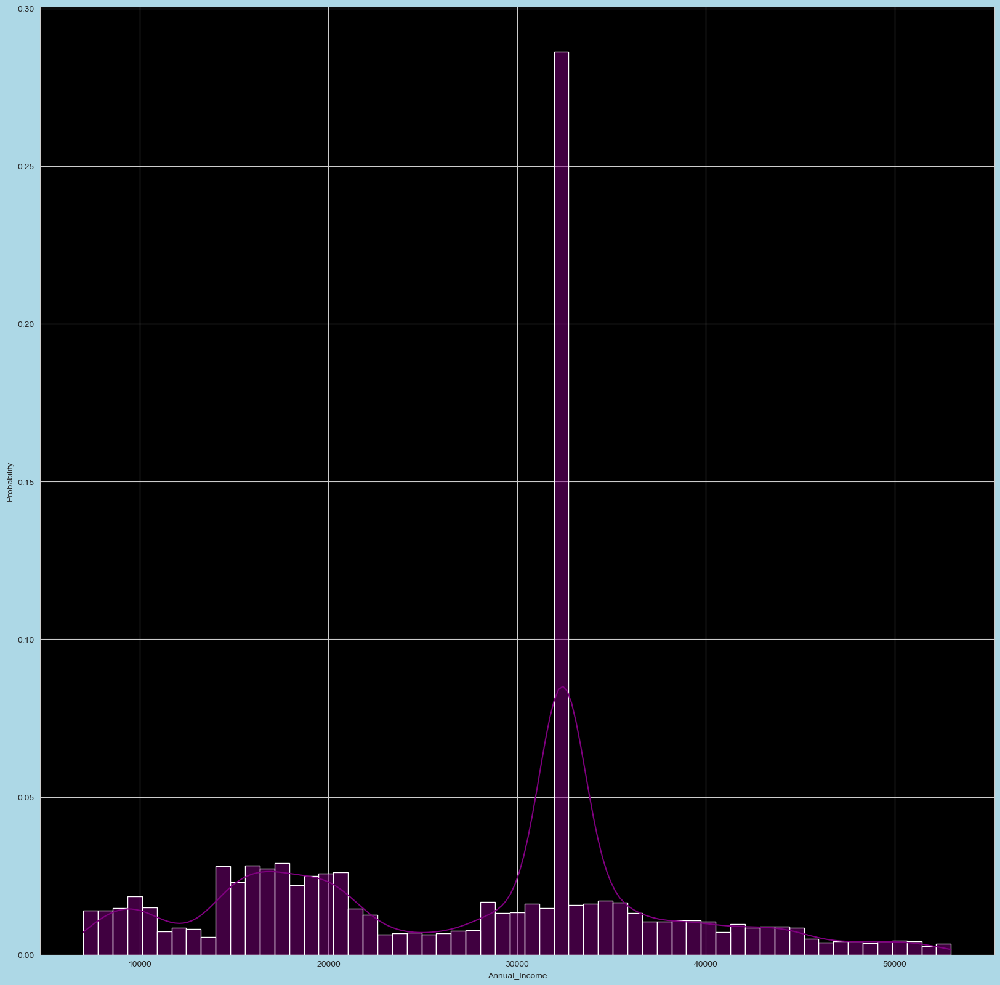

In [136]:
plt.figure(figsize = (20,20))
plt.figure(figsize=(20, 20), facecolor='lightblue')
sns.histplot(data = d1, x = 'Annual_Income', kde = True, stat = 'probability',color='purple')
plt.show()

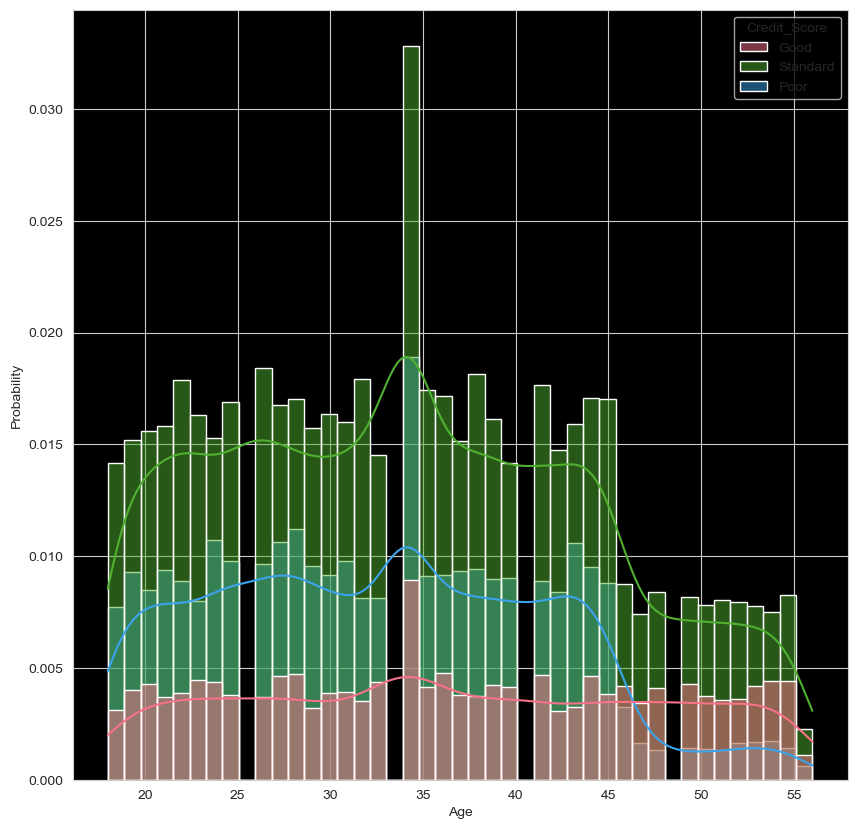

In [137]:
plt.figure(figsize = (10,10))
sns.histplot(data = d1, x = 'Age', hue = 'Credit_Score', kde = True, stat = 'probability', palette = 'husl')
plt.show()

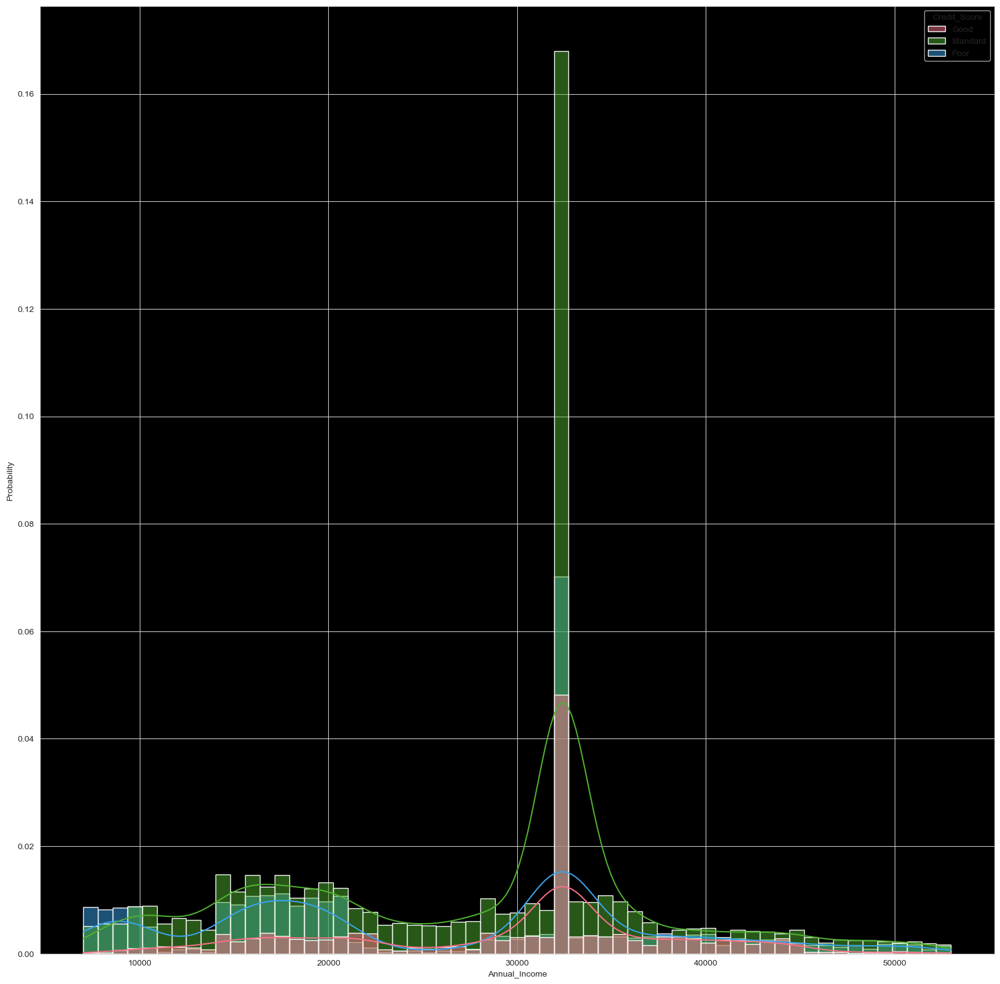

In [138]:
plt.figure(figsize = (20,20))
sns.histplot(data = d1, x = 'Annual_Income', hue = 'Credit_Score', kde = True, stat = 'probability', palette = 'husl')
plt.show()

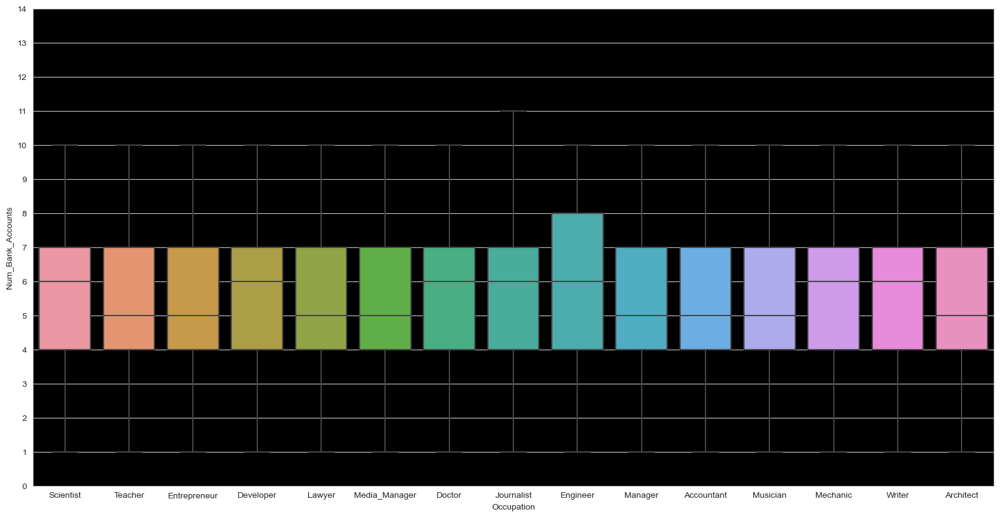

In [139]:
plt.figure(figsize = (20, 10), dpi = 100)
sns.boxplot(data = d1, x = 'Occupation', y = 'Num_Bank_Accounts')
plt.yticks(np.arange(0, 15))
plt.show()

In [140]:
d1

,Month,Age,Occupation,Annual_Income,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Credit_Score
3,April,23.0,Scientist,19114.12,3.0,4,3,5.0,4.0,6.27,4.0,Good,809.98,31.38,22 Years and 4 Months,No,49.57,114.95,Good
5,June,23.0,Scientist,19114.12,3.0,4,3,8.0,4.0,9.27,4.0,Good,809.98,27.26,22 Years and 6 Months,No,49.57,62.43,Good
6,July,23.0,Scientist,19114.12,3.0,4,3,3.0,8.0,11.27,4.0,Good,809.98,22.54,22 Years and 7 Months,No,49.57,114.95,Good
7,August,23.0,Scientist,19114.12,3.0,4,3,3.0,6.0,11.27,4.0,Good,809.98,23.93,22 Years and 7 Months,No,49.57,24.79,Standard
9,February,28.0,Teacher,34847.84,2.0,4,6,7.0,1.0,7.42,2.0,Good,605.03,38.55,26 Years and 8 Months,No,18.82,40.39,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99991,August,29.0,Architect,20002.88,10.0,8,29,33.0,25.0,18.31,9.0,Bad,1133.21,37.14,6 Years and 3 Months,Yes,60.96,34.66,Standard
99994,March,25.0,Mechanic,39628.99,4.0,6,7,20.0,6.0,9.50,3.0,Good,502.38,39.32,31 Years and 5 Months,No,35.10,140.58,Poor
99995,April,25.0,Mechanic,39628.99,4.0,6,7,23.0,7.0,11.50,3.0,Good,502.38,34.66,31 Years and 6 Months,No,35.10,60.97,Poor
99996,May,25.0,Mechanic,39628.99,4.0,6,7,18.0,7.0,11.50,3.0,Good,502.38,40.57,31 Years and 7 Months,No,35.10,54.19,Poor


In [141]:
def convert_to_decimal(years_months):
    years, months = map(int, years_months.split()[0::3])  # Extract years and months
    decimal_age = years + months / 12  # Convert to decimal
    return round(decimal_age, 1)  # Round to 1 decimal place

# Apply the conversion function to the Credit_History_Age column
d1['Credit_History_Age'] = d1['Credit_History_Age'].apply(convert_to_decimal)

In [142]:
d1.select_dtypes(include=np.object)

,Month,Occupation,Credit_Mix,Payment_of_Min_Amount,Credit_Score
3,April,Scientist,Good,No,Good
5,June,Scientist,Good,No,Good
6,July,Scientist,Good,No,Good
7,August,Scientist,Good,No,Standard
9,February,Teacher,Good,No,Good
...,...,...,...,...,...
99991,August,Architect,Bad,Yes,Standard
99994,March,Mechanic,Good,No,Poor
99995,April,Mechanic,Good,No,Poor
99996,May,Mechanic,Good,No,Poor


In [143]:
d1.select_dtypes(include=np.number)

,Age,Annual_Income,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Total_EMI_per_month,Amount_invested_monthly
3,23.0,19114.12,3.0,4,3,5.0,4.0,6.27,4.0,809.98,31.38,22.3,49.57,114.95
5,23.0,19114.12,3.0,4,3,8.0,4.0,9.27,4.0,809.98,27.26,22.5,49.57,62.43
6,23.0,19114.12,3.0,4,3,3.0,8.0,11.27,4.0,809.98,22.54,22.6,49.57,114.95
7,23.0,19114.12,3.0,4,3,3.0,6.0,11.27,4.0,809.98,23.93,22.6,49.57,24.79
9,28.0,34847.84,2.0,4,6,7.0,1.0,7.42,2.0,605.03,38.55,26.7,18.82,40.39
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99991,29.0,20002.88,10.0,8,29,33.0,25.0,18.31,9.0,1133.21,37.14,6.2,60.96,34.66
99994,25.0,39628.99,4.0,6,7,20.0,6.0,9.50,3.0,502.38,39.32,31.4,35.10,140.58
99995,25.0,39628.99,4.0,6,7,23.0,7.0,11.50,3.0,502.38,34.66,31.5,35.10,60.97
99996,25.0,39628.99,4.0,6,7,18.0,7.0,11.50,3.0,502.38,40.57,31.6,35.10,54.19


In [144]:
print(d1.nunique(),d1.dtypes)

Month                           8
Age                            39
Occupation                     15
Annual_Income                6379
Num_Bank_Accounts              11
Num_Credit_Card                12
Interest_Rate                  34
Delay_from_due_date            46
Num_of_Delayed_Payment         29
Changed_Credit_Limit         2922
Num_Credit_Inquiries           15
Credit_Mix                      3
Outstanding_Debt             8653
Credit_Utilization_Ratio     2140
Credit_History_Age            337
Payment_of_Min_Amount           3
Total_EMI_per_month          3547
Amount_invested_monthly     13553
Credit_Score                    3
dtype: int64 Month                        object
Age                         float64
Occupation                   object
Annual_Income               float64
Num_Bank_Accounts           float64
Num_Credit_Card               int64
Interest_Rate                 int64
Delay_from_due_date         float64
Num_of_Delayed_Payment      float64
Changed_Credit_Li

In [145]:
d1['Num_Bank_Accounts']=d1['Num_Bank_Accounts'].astype(int)
d1['Num_Credit_Card']=d1['Num_Credit_Card'].astype(int)
d1['Credit_History_Age']=d1['Credit_History_Age'].astype(float)

In [146]:
#Scaling

In [147]:
from sklearn.preprocessing import StandardScaler
ss=StandardScaler()
for i in d1.select_dtypes(include=np.number):
    d1[i] = ss.fit_transform(d1[[i]])
    

In [148]:
d1.dtypes

Month                        object
Age                         float64
Occupation                   object
Annual_Income               float64
Num_Bank_Accounts           float64
Num_Credit_Card             float64
Interest_Rate               float64
Delay_from_due_date         float64
Num_of_Delayed_Payment      float64
Changed_Credit_Limit        float64
Num_Credit_Inquiries        float64
Credit_Mix                   object
Outstanding_Debt            float64
Credit_Utilization_Ratio    float64
Credit_History_Age          float64
Payment_of_Min_Amount        object
Total_EMI_per_month         float64
Amount_invested_monthly     float64
Credit_Score                 object
dtype: object

In [149]:
def condition(x):
    if x == "Good":
        return 1
    elif x == "Standard":
        return 0
    else:
        return -1

d1['Credit_Score'] = d1['Credit_Score'].apply(condition)

In [150]:
d1['Credit_Mix'] = d1['Credit_Mix'].apply(condition)

In [151]:
#encoding

In [152]:
import pandas as pd

# Assuming 'df' is your pandas DataFrame and 'column' is the categorical column
one_hot_encoded = pd.get_dummies(d1['Occupation'])
d1 = pd.concat([d1, one_hot_encoded], axis=1)

In [153]:
d1.drop(columns=['Occupation'], inplace=True)

In [154]:
d1.drop(columns=['Month'], inplace=True)

In [155]:
d1.drop(columns=['Payment_of_Min_Amount'], inplace=True)

In [156]:
d1

,Age,Annual_Income,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Total_EMI_per_month,Amount_invested_monthly,Credit_Score,Accountant,Architect,Developer,Doctor,Engineer,Entrepreneur,Journalist,Lawyer,Manager,Mechanic,Media_Manager,Musician,Scientist,Teacher,Writer
3,-1.142491,-0.801863,-1.100017,-0.742439,-1.359180,-1.310723,-1.625756,-0.659763,-0.429265,1,-0.427454,-0.130458,0.444379,0.336035,0.501928,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
5,-1.142491,-0.801863,-1.100017,-0.742439,-1.359180,-1.006312,-1.625756,-0.118485,-0.429265,1,-0.427454,-0.955372,0.469306,0.336035,-0.897741,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
6,-1.142491,-0.801863,-1.100017,-0.742439,-1.359180,-1.513664,-0.941826,0.242367,-0.429265,1,-0.427454,-1.900419,0.481770,0.336035,0.501928,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
7,-1.142491,-0.801863,-1.100017,-0.742439,-1.359180,-1.513664,-1.283791,0.242367,-0.429265,1,-0.427454,-1.622110,0.481770,0.336035,-1.900854,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
9,-0.637642,0.716609,-1.535001,-0.742439,-1.001615,-1.107783,-2.138703,-0.452273,-0.985175,1,-0.726191,1.305132,0.992783,-1.093514,-1.485111,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99991,-0.536672,-0.716088,1.944871,1.270129,1.739712,1.530444,1.964873,1.512566,0.960508,-1,0.043689,1.022820,-1.562281,0.865550,-1.637817,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
99994,-0.940551,1.178042,-0.665033,0.263845,-0.882427,0.211330,-1.283791,-0.076987,-0.707220,1,-0.875815,1.459303,1.578578,-0.336667,1.184973,-1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
99995,-0.940551,1.178042,-0.665033,0.263845,-0.882427,0.515741,-1.112809,0.283865,-0.707220,1,-0.875815,0.526270,1.591041,-0.336667,-0.936650,-1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
99996,-0.940551,1.178042,-0.665033,0.263845,-0.882427,0.008390,-1.112809,0.283865,-0.707220,1,-0.875815,1.709580,1.603505,-0.336667,-1.117338,-1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0


# Model Building 

In [158]:
x = d1.drop('Credit_Score', axis=1)  # Features
y = d1['Credit_Score']  # Target variable

In [159]:
x

,Age,Annual_Income,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Total_EMI_per_month,Amount_invested_monthly,Accountant,Architect,Developer,Doctor,Engineer,Entrepreneur,Journalist,Lawyer,Manager,Mechanic,Media_Manager,Musician,Scientist,Teacher,Writer
3,-1.142491,-0.801863,-1.100017,-0.742439,-1.359180,-1.310723,-1.625756,-0.659763,-0.429265,1,-0.427454,-0.130458,0.444379,0.336035,0.501928,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
5,-1.142491,-0.801863,-1.100017,-0.742439,-1.359180,-1.006312,-1.625756,-0.118485,-0.429265,1,-0.427454,-0.955372,0.469306,0.336035,-0.897741,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
6,-1.142491,-0.801863,-1.100017,-0.742439,-1.359180,-1.513664,-0.941826,0.242367,-0.429265,1,-0.427454,-1.900419,0.481770,0.336035,0.501928,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
7,-1.142491,-0.801863,-1.100017,-0.742439,-1.359180,-1.513664,-1.283791,0.242367,-0.429265,1,-0.427454,-1.622110,0.481770,0.336035,-1.900854,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
9,-0.637642,0.716609,-1.535001,-0.742439,-1.001615,-1.107783,-2.138703,-0.452273,-0.985175,1,-0.726191,1.305132,0.992783,-1.093514,-1.485111,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99991,-0.536672,-0.716088,1.944871,1.270129,1.739712,1.530444,1.964873,1.512566,0.960508,-1,0.043689,1.022820,-1.562281,0.865550,-1.637817,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
99994,-0.940551,1.178042,-0.665033,0.263845,-0.882427,0.211330,-1.283791,-0.076987,-0.707220,1,-0.875815,1.459303,1.578578,-0.336667,1.184973,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
99995,-0.940551,1.178042,-0.665033,0.263845,-0.882427,0.515741,-1.112809,0.283865,-0.707220,1,-0.875815,0.526270,1.591041,-0.336667,-0.936650,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
99996,-0.940551,1.178042,-0.665033,0.263845,-0.882427,0.008390,-1.112809,0.283865,-0.707220,1,-0.875815,1.709580,1.603505,-0.336667,-1.117338,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0


In [160]:
y

3        1
5        1
6        1
7        0
9        1
        ..
99991    0
99994   -1
99995   -1
99996   -1
99999   -1
Name: Credit_Score, Length: 46055, dtype: int64

In [161]:
from sklearn.model_selection import train_test_split

# Split the data into training and testing sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

### Data Balancing (SMOTE)

In [162]:
y.value_counts(normalize=True)

 0    0.555879
-1    0.286180
 1    0.157942
Name: Credit_Score, dtype: float64

In [163]:
from imblearn.over_sampling import SMOTE
rus = SMOTE(sampling_strategy='auto')

In [164]:
x_test, y_test = rus.fit_resample(x, y)
y_test.value_counts(normalize=True)

 1    0.333333
 0    0.333333
-1    0.333333
Name: Credit_Score, dtype: float64

# LogisticRegression

In [165]:

lg=LogisticRegression()
model=lg.fit(x_train, y_train)
y_pred=model.predict(x_test)

In [166]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

          -1       0.82      0.59      0.69     25601
           0       0.51      0.79      0.62     25601
           1       0.80      0.59      0.68     25601

    accuracy                           0.66     76803
   macro avg       0.71      0.66      0.66     76803
weighted avg       0.71      0.66      0.66     76803



In [167]:
print(accuracy_score(y_test, y_pred))

0.6581774149447287


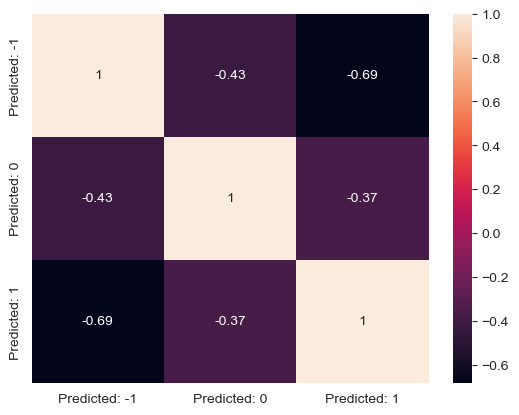

In [168]:
from sklearn.metrics import confusion_matrix
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

cm = confusion_matrix(y_test, y_pred)
matrix = pd.DataFrame(data=cm, index=['Actual: -1', 'Actual: 0','Actual: 1'], columns=['Predicted: -1', 'Predicted: 0','Predicted: 1'])
sns.heatmap(matrix.corr(), annot=True)
plt.show()

### GridSearch , Hypertuning

In [169]:
from sklearn.model_selection import GridSearchCV
param_grid = {
    'C': [0.1, 1, 10],
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear', 'saga']
}


# Create the GridSearchCV object
grid_search = GridSearchCV(model, param_grid, cv=5)

In [170]:
# Fit the data to perform the grid search
grid_search.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=LogisticRegression(),
             param_grid={'C': [0.1, 1, 10], 'penalty': ['l1', 'l2'],
                         'solver': ['liblinear', 'saga']})

In [171]:
# Access the best parameters found during the grid search
best_params = grid_search.best_params_
best_params 

{'C': 1, 'penalty': 'l1', 'solver': 'saga'}

In [172]:
# Access the best model
best_model = grid_search.best_estimator_

# Evaluate the best model on the test set
accuracy = best_model.score(x_test, y_test)
accuracy

0.6519276590758174

In [173]:
# Print the results
print("Best Parameters:", best_params)
print("Best Model Accuracy:", accuracy)

Best Parameters: {'C': 1, 'penalty': 'l1', 'solver': 'saga'}
Best Model Accuracy: 0.6519276590758174


'C': [0.1, 1, 10]: The hyperparameter 'C' controls the inverse of the regularization strength. It represents how much emphasis the model should give to fitting the training data versus minimizing the complexity of the model. In this case, we are testing three different values: 0.1, 1, and 10.

'penalty': ['l1', 'l2']: The hyperparameter 'penalty' determines the type of regularization to be applied. Regularization helps prevent overfitting by adding a penalty term to the loss function. The two options here are 'l1' (Lasso regularization) and 'l2' (Ridge regularization).

'solver': ['liblinear', 'saga']: The hyperparameter 'solver' specifies the algorithm to use in the optimization problem of logistic regression. Different solvers use different mathematical techniques to find the best parameters. The options provided here are 'liblinear' and 'saga'.

# Random Forest Classifier

In [207]:
rfd=RandomForestClassifier()
model=rfd.fit(x_train, y_train)
y_pred=model.predict(x_test)

In [208]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

          -1       0.97      0.93      0.95     25601
           0       0.82      0.97      0.89     25601
           1       0.98      0.86      0.91     25601

    accuracy                           0.92     76803
   macro avg       0.93      0.92      0.92     76803
weighted avg       0.93      0.92      0.92     76803



In [210]:
print(accuracy_score(y_test, y_pred))

0.916982409541294


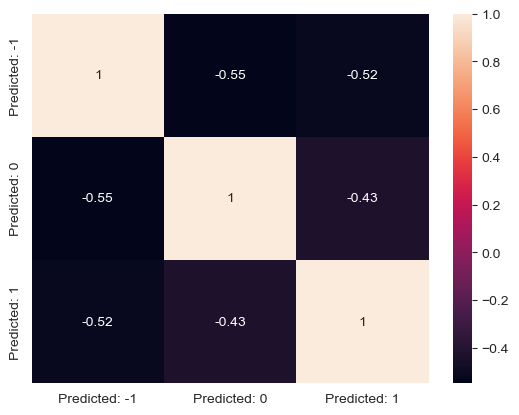

In [177]:
from sklearn.metrics import confusion_matrix
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

cm = confusion_matrix(y_test, y_pred)
matrix = pd.DataFrame(data=cm, index=['Actual: -1', 'Actual: 0','Actual: 1'], columns=['Predicted: -1', 'Predicted: 0','Predicted: 1'])
sns.heatmap(matrix.corr(), annot=True)
plt.show()

In [214]:
# Get the feature importances
importances = model.feature_importances_

In [215]:
# Sort the feature importances in descending order
indices = np.argsort(importances)[::-1]

# Print the feature rankings
for i, index in enumerate(indices):
    print(f"{i+1}. Feature: {x_train.columns[index]}, Importance: {importances[index]}")

1. Feature: Outstanding_Debt, Importance: 0.11616569816808946
2. Feature: Interest_Rate, Importance: 0.09982408647810014
3. Feature: Credit_Mix, Importance: 0.08691549872847906
4. Feature: Credit_History_Age, Importance: 0.08068110046103268
5. Feature: Credit_Utilization_Ratio, Importance: 0.062290533115917424
6. Feature: Changed_Credit_Limit, Importance: 0.06028765286181338
7. Feature: Delay_from_due_date, Importance: 0.057922592529100585
8. Feature: Num_Credit_Inquiries, Importance: 0.054098930205193865
9. Feature: Num_Credit_Card, Importance: 0.0538795023946564
10. Feature: Num_of_Delayed_Payment, Importance: 0.052056384503967254
11. Feature: Amount_invested_monthly, Importance: 0.05192298977835144
12. Feature: Age, Importance: 0.045212950272501044
13. Feature: Annual_Income, Importance: 0.04394016387732044
14. Feature: Num_Bank_Accounts, Importance: 0.03745207513311954
15. Feature: Total_EMI_per_month, Importance: 0.03440149701516144
16. Feature: Scientist, Importance: 0.0044649975

### Gridsearch for hyperparameter tuning

In [178]:
# Define the parameter grid for hyperparameter tuning
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 5, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

In [179]:
# Create the GridSearchCV object
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy')

# Perform the grid search on your data
grid_search.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'max_depth': [None, 5, 10],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [100, 200, 300]},
             scoring='accuracy')

In [180]:
# Get the best hyperparameters found
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

Best Hyperparameters: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}


max_depth: The maximum depth of each decision tree in the random forest. In this case, the value "None" indicates that there is no maximum depth, and the trees are expanded until all leaves are pure or until all leaves contain a minimum number of samples.

min_samples_leaf: The minimum number of samples required to be at a leaf node. A smaller value allows the tree to capture more specific patterns but may lead to overfitting if set too low. In this case, the value is set to 1, meaning each leaf node must contain at least one sample.

min_samples_split: The minimum number of samples required to split an internal node. Similar to min_samples_leaf, a smaller value allows for more splits, potentially capturing more detailed patterns. The value is set to 2, meaning a node must have at least two samples to be considered for splitting.

n_estimators: The number of decision trees in the random forest. Increasing the number of trees generally improves the model's performance, but at the cost of increased computational time. Here, the value is set to 200, indicating that the random forest consists of 200 decision trees.

In [181]:
# Evaluate the best model on the test set
best_model = grid_search.best_estimator_
y_pred = best_model.predict(x_test)

# Print the classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

Classification Report:
              precision    recall  f1-score   support

          -1       0.97      0.93      0.95     25601
           0       0.83      0.97      0.89     25601
           1       0.98      0.86      0.91     25601

    accuracy                           0.92     76803
   macro avg       0.93      0.92      0.92     76803
weighted avg       0.93      0.92      0.92     76803



# Decision Tree Classifier

In [182]:
dc=DecisionTreeClassifier()
model=dc.fit(x_train, y_train)
y_pred=model.predict(x_test)

In [183]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

          -1       0.94      0.88      0.91     25601
           0       0.77      0.96      0.85     25601
           1       0.96      0.79      0.87     25601

    accuracy                           0.87     76803
   macro avg       0.89      0.87      0.88     76803
weighted avg       0.89      0.87      0.88     76803



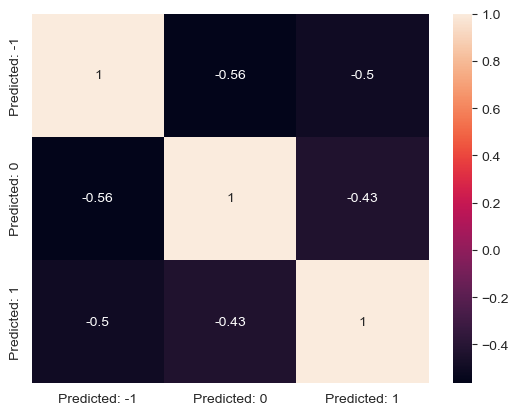

In [184]:
from sklearn.metrics import confusion_matrix
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

cm = confusion_matrix(y_test, y_pred)
matrix = pd.DataFrame(data=cm, index=['Actual: -1', 'Actual: 0','Actual: 1'], columns=['Predicted: -1', 'Predicted: 0','Predicted: 1'])
sns.heatmap(matrix.corr(), annot=True)
plt.show()

In [185]:
print(accuracy_score(y_test, y_pred))

0.8742887647617932


### GridSerach Hypertuning

In [186]:
# Define the parameter grid for hyperparameter tuning
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Create the GridSearchCV object
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy')

In [187]:

# Perform the grid search on your data
grid_search.fit(x_train, y_train)

# Get the best hyperparameters found
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

Best Hyperparameters: {'criterion': 'gini', 'max_depth': 15, 'min_samples_leaf': 1, 'min_samples_split': 2}


criterion: The criterion parameter determines the quality of a split in the Decision Tree. In this case, the value "gini" is chosen, which indicates that the Gini impurity is used as the criterion for splitting. The Gini impurity measures the probability of incorrectly classifying a randomly chosen element from the set.

max_depth: The max_depth parameter sets the maximum depth or the maximum number of levels in the Decision Tree. In this case, the value is set to 15, meaning the tree will be grown with a maximum depth of 15 levels. Limiting the depth can help prevent overfitting and improve generalization.

min_samples_leaf: The min_samples_leaf parameter determines the minimum number of samples required to be at a leaf node. A leaf node is a node without any further split. Here, the value is set to 1, meaning each leaf node must contain at least one sample. Setting a small value for this parameter can lead to more specific and detailed decision rules.

min_samples_split: The min_samples_split parameter sets the minimum number of samples required to split an internal node. An internal node is a node that has further splits. In this case, the value is set to 2, meaning a node must have at least two samples to be considered for splitting. Setting a small value for this parameter can potentially lead to a more complex decision tree.

These hyperparameters have been identified as the best based on the evaluation metric used during the hyperparameter tuning process, such as accuracy, precision, or F1-score. It's important to note that the best hyperparameters may vary depending on the dataset and the specific problem you are working on.

In [188]:
# Evaluate the best model on the test set
best_model = grid_search.best_estimator_
y_pred = best_model.predict(x_test)

# Print the classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

Classification Report:
              precision    recall  f1-score   support

          -1       0.89      0.79      0.84     25601
           0       0.64      0.87      0.74     25601
           1       0.89      0.68      0.77     25601

    accuracy                           0.78     76803
   macro avg       0.81      0.78      0.78     76803
weighted avg       0.81      0.78      0.78     76803



# Gradient Boosting Classifier

In [217]:
from sklearn.ensemble import GradientBoostingClassifier

# Create a Gradient Boosting classifier
model = GradientBoostingClassifier()

# Fit the model on the training data
model.fit(x_train, y_train)

# Make predictions on the test data
y_pred = model.predict(x_test)

In [218]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

          -1       0.85      0.69      0.76     25601
           0       0.60      0.79      0.68     25601
           1       0.81      0.70      0.75     25601

    accuracy                           0.73     76803
   macro avg       0.75      0.73      0.73     76803
weighted avg       0.75      0.73      0.73     76803



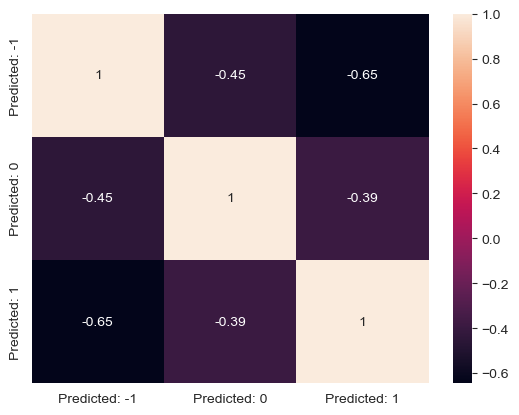

In [219]:
from sklearn.metrics import confusion_matrix
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

cm = confusion_matrix(y_test, y_pred)
matrix = pd.DataFrame(data=cm, index=['Actual: -1', 'Actual: 0','Actual: 1'], columns=['Predicted: -1', 'Predicted: 0','Predicted: 1'])
sns.heatmap(matrix.corr(), annot=True)
plt.show()

In [220]:
print(accuracy_score(y_test, y_pred))

0.7283960261968934


### Gridsearch Hypertuning 

In [221]:
param_grid = {
    'learning_rate': [0.1, 0.01, 0.001],
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 5, 7],
    'subsample': [0.8, 1.0],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Create the GridSearchCV object
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy')

In [ ]:
# Perform the grid search on your data
grid_search.fit(x_train, y_train)

# Get the best hyperparameters found
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

In [ ]:
# Evaluate the best model on the test set
best_model = grid_search.best_estimator_
y_pred = best_model.predict(x_test)

# Print the classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# K Neighbors Classifier

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

# Create a KNN classifier
model = KNeighborsClassifier()

# Fit the model on the training data
model.fit(x_train, y_train)

# Make predictions on the test data
y_pred = model.predict(x_test)

In [ ]:
print(classification_report(y_test, y_pred))

In [ ]:
from sklearn.metrics import confusion_matrix
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

cm = confusion_matrix(y_test, y_pred)
matrix = pd.DataFrame(data=cm, index=['Actual: -1', 'Actual: 0','Actual: 1'], columns=['Predicted: -1', 'Predicted: 0','Predicted: 1'])
sns.heatmap(matrix.corr(), annot=True)
plt.show()

In [ ]:
print(accuracy_score(y_test, y_pred))

### GridSearch Hypertuning 

In [ ]:
param_grid = {
    'n_neighbors': [3, 5, 7],
    'weights': ['uniform', 'distance'],
    'p': [1, 2]
}

# Create the GridSearchCV object
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy')

In [ ]:
# Perform the grid search on your data
grid_search.fit(x_train, y_train)

# Get the best hyperparameters found
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

In [ ]:
# Evaluate the best model on the test set
best_model = grid_search.best_estimator_
y_pred = best_model.predict(x_test)

# Print the classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Naive Bayes

In [ ]:

from sklearn.naive_bayes import GaussianNB

# Create a Naive Bayes classifier
model = GaussianNB()

# Fit the model on the training data
model.fit(x_train, y_train)

# Make predictions on the test data
y_pred = model.predict(x_test)

In [ ]:
print(classification_report(y_test, y_pred))

In [ ]:
from sklearn.metrics import confusion_matrix
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

cm = confusion_matrix(y_test, y_pred)
matrix = pd.DataFrame(data=cm, index=['Actual: -1', 'Actual: 0','Actual: 1'], columns=['Predicted: -1', 'Predicted: 0','Predicted: 1'])
sns.heatmap(matrix.corr(), annot=True)
plt.show()

In [ ]:
print(accuracy_score(y_test, y_pred))

### GridSearch Hypertuning

In [ ]:
param_grid = {
    'alpha': [0.1, 1.0, 10.0]
}

# Create the GridSearchCV object
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy')

In [ ]:
# Perform the grid search on your data
grid_search.fit(x_train, y_train)

# Get the best hyperparameters found
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

# Evaluate the best model on the test set
best_model = grid_search.best_estimator_
y_pred = best_model.predict(x_test)

# Print the classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

### Conclusion

According to models, and hypertunings., I came to conclusion that., Got Random Forest with 91.5% Accuracy.,

So prediction here, is much better for all three clases

[Best Hyperparameters: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}]
with this parameter, im getting proper 92%., Random Forest is the model which works efficiently according to my Analysis

Features that are important are
1. Feature: Outstanding_Debt, Importance: 0.11616569816808946
2. Feature: Interest_Rate, Importance: 0.09982408647810014
3. Feature: Credit_Mix, Importance: 0.08691549872847906
4. Feature: Credit_History_Age, Importance: 0.08068110046103268
5. Feature: Credit_Utilization_Ratio, Importance: 0.062290533115917424
6. Feature: Changed_Credit_Limit, Importance: 0.06028765286181338
7. Feature: Delay_from_due_date, Importance: 0.057922592529100585
8. Feature: Num_Credit_Inquiries, Importance: 0.054098930205193865
9. Feature: Num_Credit_Card, Importance: 0.0538795023946564
10. Feature: Num_of_Delayed_Payment, Importance: 0.052056384503967254
11. Feature: Amount_invested_monthly, Importance: 0.05192298977835144
12. Feature: Age, Importance: 0.045212950272501044
13. Feature: Annual_Income, Importance: 0.04394016387732044
14. Feature: Num_Bank_Accounts, Importance: 0.03745207513311954
15. Feature: Total_EMI_per_month, Importance: 0.03440149701516144
16. Feature: Scientist, Importance: 0.004464997555312351
17. Feature: Entrepreneur, Importance: 0.004404195100681164
18. Feature: Developer, Importance: 0.004386874671667979
19. Feature: Musician, Importance: 0.0043688960948703994
20. Feature: Lawyer, Importance: 0.004352696335676829
21. Feature: Accountant, Importance: 0.004290329534800232
22. Feature: Doctor, Importance: 0.004285540788459592
23. Feature: Manager, Importance: 0.004228140891934566
24. Feature: Engineer, Importance: 0.004149321960333991
25. Feature: Architect, Importance: 0.004146040054002441
26. Feature: Journalist, Importance: 0.004114080769348955
27. Feature: Media_Manager, Importance: 0.004017577808106935
28. Feature: Teacher, Importance: 0.003931967951289236
29. Feature: Writer, Importance: 0.003920336502920391
30. Feature: Mechanic, Importance: 0.0038873484577909125



### LEARNINGS

1.I understood., different ways of trating extreme and null values., It could be standard or non-standard null values

2. When data is imbalanced , I understood., how SMOTE comes to action., Balancing data was new to us, still understood how it works internally

3. Credit card score prediction plays vital role in financial industry., as
Credit scores are numerical representations of an individual's creditworthiness, indicating the likelihood of repaying debts and meeting financial obligations.

Lenders and financial institutions use credit scores to assess the risk associated with lending money or extending credit to an individual.

Credit scores are calculated based on various factors, including payment history, credit utilization, length of credit history, types of credit accounts, and recent credit inquiries.

A higher credit score indicates a lower credit risk, making it more likely for individuals to qualify for loans, credit cards, and favorable interest rates.

Credit scores can impact the terms and conditions offered by lenders, such as loan approval, interest rates, credit limits, and insurance premiums.

Monitoring and maintaining a good credit score is important as it can affect an individual's financial opportunities and access to credit in the future.

Credit scores are typically provided by credit bureaus or credit reporting agencies, such as Equifax, Experian, and TransUnion, which collect and analyze credit-related data.

It is advisable for individuals to regularly review their credit reports and credit scores to ensure accuracy, identify areas for improvement, and detect any potential fraud or identity theft.


#### ----------------------------------------------------------Thank you for the Opportunity-------------------------------------------------------